# <font color = '#e64626'><center>QBUS6810 Group Assignment</center></font>
### <center>Group 160: *480140973 520600843 480038647 510488543 500135329*</center>

# Table of Contents

1. [Data Processing](#data_processing)
2. [Exploratory Data Analysis](#eda)
3. [Feature Engineering](#feature_engineering)
4. [Methodology](#methodology)
<br> 4.1 [Model 1: *OLS*](#model_1)
<br> 4.2 [Model 2: *Ridge/Lasso Regression*](#model_2)
<br> 4.3 [Model 3: *Single Regression Tree*](#model_3)
<br> 4.4 [Model 4: *Gradient Boosting*](#model_4)
<br> 4.5 [Model 5: *Model Stack*](#model_5)

In [1]:
#!pip install -U kaleido

In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import dataprep
import statistics

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from dataprep.eda import plot
from datetime import datetime

from scipy.stats import skew
from scipy.stats import kurtosis

import nltk
import ast

In [3]:
rc = {"xtick.labelsize": 12, "ytick.labelsize": 12, "axes.labelsize": 12, 
      "axes.titlesize": 12, "legend.fontsize": 12}
sns.set_context("notebook", rc=rc)  

## <font color = '#e64626'><a id='data_processing'>1. Data Processing</a></font>

In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

response = 'price'

y_train = train[response]

In [5]:
# no dulicates
train.drop_duplicates(inplace=True) 
train.shape

(4000, 36)

In [6]:
# no dulicates
test.drop_duplicates(inplace=True) 
test.shape

(2000, 35)

# Check accuracy and correct the data type

In [7]:
# host_since: create "hs_year"
train['host_since'] = pd.to_datetime(train['host_since'])
train['hs_year'] = pd.DatetimeIndex(train['host_since']).year

test['host_since'] = pd.to_datetime(test['host_since'])
test['hs_year'] = pd.DatetimeIndex(test['host_since']).year

In [8]:
# host_response_rate
train['host_response_rate']=train['host_response_rate'].str.rstrip('%').astype('float') / 100.0

test['host_response_rate']=test['host_response_rate'].str.rstrip('%').astype('float') / 100.0

In [9]:
# host_acceptance_rate
train['host_acceptance_rate']=train['host_acceptance_rate'].str.rstrip('%').astype('float') / 100.0

test['host_acceptance_rate']=test['host_acceptance_rate'].str.rstrip('%').astype('float') / 100.0

In [10]:
# host_location
train["host_location"] = train["host_location"].fillna("Unknown")


In [11]:
# extract city only 
train['host_location'] = train['host_location'].str.split(",").str.get(0)
test['host_location'] = test['host_location'].str.split(",").str.get(0)

# Handle missing values

In [12]:
#missing value
missing =round((train.isnull().sum().sort_values(ascending=False)/train.shape[0]*100),1)
missing_df= pd.DataFrame({'Features':missing.index, 'Percentage of missing values':missing.values}) 
missing_df

,Features,Percentage of missing values
0,host_neighbourhood,38.9
1,neighborhood_overview,10.2
2,neighbourhood,10.2
3,bedrooms,6.7
4,host_response_time,3.3
5,host_response_rate,3.3
6,host_acceptance_rate,2.2
7,beds,0.5
8,description,0.0
9,review_scores_cleanliness,0.0


In [13]:
missing =round((test.isnull().sum().sort_values(ascending=False)/test.shape[0]*100),1)
missing_df= pd.DataFrame({'Features':missing.index, 'Percentage of missing values':missing.values}) 
missing_df

,Features,Percentage of missing values
0,host_neighbourhood,39.1
1,host_location,14.2
2,neighborhood_overview,11.0
3,neighbourhood,11.0
4,bedrooms,6.2
5,host_response_time,2.6
6,host_response_rate,2.6
7,host_acceptance_rate,2.4
8,beds,0.6
9,review_scores_cleanliness,0.0


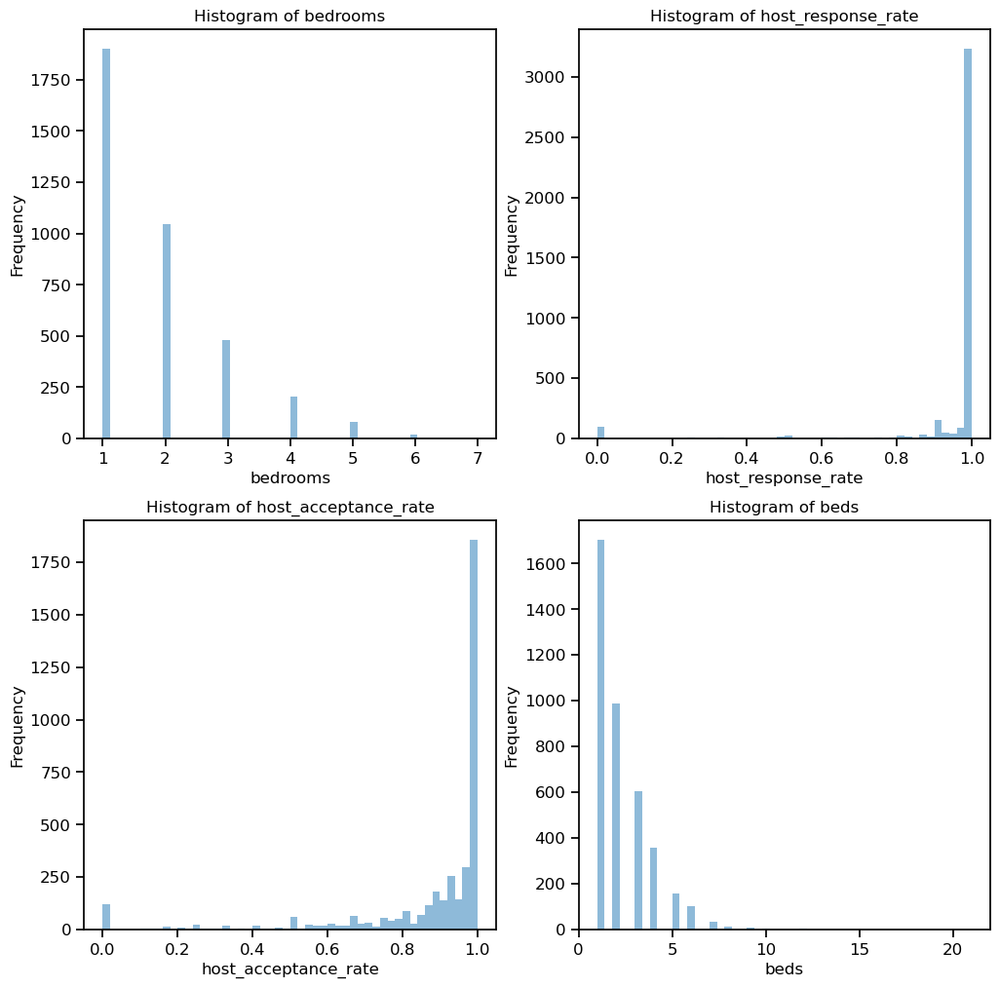

In [14]:
# check the distribution of numerical varariables that have missing values 
fig, axs = plt.subplots(2, 2, figsize=(12,12))

axs[0, 0].hist(train['bedrooms'], bins = 50, alpha = 0.5)
axs[0, 0].set_title('Histogram of bedrooms')
axs[0, 0].set(xlabel='bedrooms', ylabel='Frequency')


axs[0, 1].hist(train['host_response_rate'], bins = 50, alpha = 0.5)
axs[0, 1].set_title('Histogram of host_response_rate')
axs[0, 1].set(xlabel='host_response_rate', ylabel='Frequency')


axs[1, 0].hist(train['host_acceptance_rate'], bins = 50, alpha = 0.5)
axs[1, 0].set_title('Histogram of host_acceptance_rate')
axs[1, 0].set(xlabel='host_acceptance_rate', ylabel='Frequency')


axs[1, 1].hist(train['beds'], bins = 50, alpha = 0.5)
axs[1, 1].set_title('Histogram of beds')
axs[1, 1].set(xlabel='beds', ylabel='Frequency')


plt.show()

In [15]:
# all pretty skew, so replace missing values with modes
# replace nulls with 0 for bedrooms
train["bedrooms"] = train["bedrooms"].fillna(0)
train["host_response_rate"] = train["host_response_rate"].fillna(1)
train["host_acceptance_rate"] = train["host_acceptance_rate"].fillna(1)  
train["beds"] = train["beds"].fillna(1) 

test["bedrooms"] = test["bedrooms"].fillna(0)
test["host_response_rate"] = test["host_response_rate"].fillna(1)
test["host_acceptance_rate"] = test["host_acceptance_rate"].fillna(1)
test["beds"] = test["beds"].fillna(1)

Feature engineering:  
get dummy for bedrooms  
notice test bedroom have no 7, but 11, we add in one dummy "7 bedroom" for test with all 0

In [16]:

bedroom_dum = pd.get_dummies(train["bedrooms"], drop_first=True)  #basic: 0.0

train = pd.concat([train, bedroom_dum],axis=1)

bedroom1_dum = pd.get_dummies(test["bedrooms"], drop_first=True) 

test = pd.concat([test, bedroom1_dum],axis=1)

In [17]:
train = train.rename({1.0:'1 bedroom'}, axis=1)
train = train.rename({2.0:'2 bedroom'}, axis=1)
train = train.rename({3.0:'3 bedroom'}, axis=1)
train = train.rename({4.0:'4 bedroom'}, axis=1)
train = train.rename({5.0:'5 bedroom'}, axis=1)
train = train.rename({6.0:'6 bedroom'}, axis=1)
train = train.rename({7.0:'greater or equal 7 bedroom'}, axis=1)

test = test.rename({1.0:'1 bedroom'}, axis=1)
test = test.rename({2.0:'2 bedroom'}, axis=1)
test = test.rename({3.0:'3 bedroom'}, axis=1)
test = test.rename({4.0:'4 bedroom'}, axis=1)
test = test.rename({5.0:'5 bedroom'}, axis=1)
test = test.rename({6.0:'6 bedroom'}, axis=1)
test = test.rename({11.0:'greater or equal 7 bedroom'}, axis=1)

In [18]:
test['bedrooms'].value_counts()

1.0     978
2.0     515
3.0     245
0.0     124
4.0      95
5.0      37
6.0       5
11.0      1
Name: bedrooms, dtype: int64

In [19]:
test['7 bedroom'] = 0

In [20]:
# fill nulls of categorical varariables with "Unknown"
train["description"] = train["description"].fillna("Unknown")
train["neighborhood_overview"] = train["neighborhood_overview"].fillna("Unknown")
train["host_location"] = train["host_location"].fillna("Unknown")
train["host_response_time"] = train["host_response_time"].fillna("Unknown")
train["host_neighbourhood"] = train["host_neighbourhood"].fillna("Unknown")
train["neighbourhood"] = train["neighbourhood"].fillna("Unknown")

test["description"] = test["description"].fillna("Unknown")
test["neighborhood_overview"] = test["neighborhood_overview"].fillna("Unknown")
test["host_location"] = test["host_location"].fillna("Unknown")
test["host_response_time"] = test["host_response_time"].fillna("Unknown")
test["host_neighbourhood"] = test["host_neighbourhood"].fillna("Unknown")
test["neighbourhood"] = test["neighbourhood"].fillna("Unknown")

In [21]:
train.isna().sum()

id                             0
price                          0
description                    0
neighborhood_overview          0
host_since                     0
host_location                  0
host_response_time             0
host_response_rate             0
host_acceptance_rate           0
host_is_superhost              0
host_neighbourhood             0
host_listings_count            0
host_verifications             0
host_identity_verified         0
neighbourhood                  0
neighbourhood_cleansed         0
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bedrooms                       0
beds                           0
amenities                      0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_sco

# Drop unimportant columns

In [22]:
train = train.drop(['id','description',"host_listings_count",'host_verifications','neighbourhood','host_neighbourhood'],axis =1)

                    

In [23]:
test = test.drop(['id','description',"host_listings_count",'host_verifications','neighbourhood','host_neighbourhood'],axis =1)

# <font color = '#e64626'><a id='eda'>2. Exploratory Data Analysis</a></font>

The example provided here is to show you how to save figures of an appropriate resolution by using <tt>dpi</tt>. The <tt>bbox_inches='tight'</tt> is used to ensure that when your figure is saved, there are no cropping issues. In the example, the figure is saved as a <tt>.png</tt>, but you may also want to save your figures as a <tt>.pdf</tt>.

When you produce figures, make sure that all axes labels are readable. This notebook has been setup so that in general, the fontsizes are readable. These are defined in cell [2].

You can change the dimensions of the figure by changing the `figsize`.

In [24]:
df = train.copy()

## price 

In [25]:
df[df['price'] > 150]['price'].count()

2581

In [26]:
df[df['price'] <= 150]['price'].count()

1419

Text(0.5, 1.0, 'Distribution of Price')

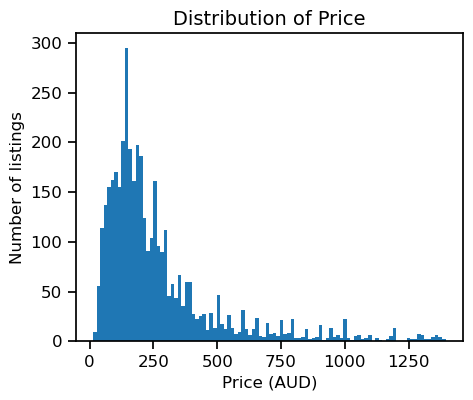

In [27]:
plt.figure(figsize=(5, 4))
plt.hist(y_train, bins=100);
plt.xlabel('Price (AUD)')
plt.ylabel('Number of listings')
plt.title('Distribution of Price',size = 14)

[Text(0.5, 0, 'Log Price')]

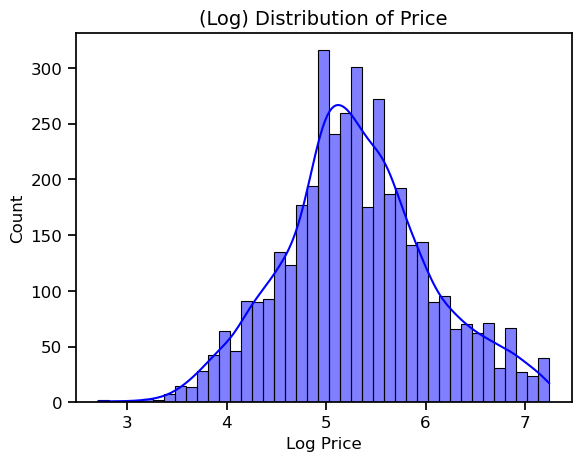

In [28]:
# we can take log to see if it makes a better residual plot
a = sns.histplot(x=np.log(y_train+1),kde=True,color="blue")
a.set_title("(Log) Distribution of Price",fontsize = 14)
a.set(xlabel='Log Price')

In [29]:
print(skew(np.log(y_train+1), axis=0, bias=True))

0.16697555838119088


In [30]:
print(kurtosis(np.log(y_train+1), axis=0, bias=True))

-0.012382635605824532


## neighborhood_overview

In [31]:
df_200 = df[df['price'] > 312] 

In [32]:
from nltk.tokenize import TweetTokenizer
import string
string.punctuation

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as stopwords

from nltk.stem.porter import PorterStemmer

In [33]:
Tokenizer = TweetTokenizer()
def process_text(text):
    
    tokenized = Tokenizer.tokenize(text)
    
    processed = []
    for word in tokenized:
        if word not in string.punctuation:
            word = word.lower()
            if word not in stopwords:
                processed.append("" + PorterStemmer().stem(word) + "")
    
    return processed

In [34]:
df_200['nei_overview_tokens'] = df_200['neighborhood_overview'].apply(process_text)



/var/folders/3c/zgwqp6yn5dlg18j9wfwc_lpm0000gn/T/ipykernel_51569/1138062798.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_200['nei_overview_tokens'] = df_200['neighborhood_overview'].apply(process_text)


In [35]:
df_200['nei_overview_tokens']

3       [close, coffe, shop, restaur, movi, cinema, br...
7       [home, haven, heart, vibrant, bohemian, eclect...
9       [great, beach-sid, suburb, superb, cafe, resta...
12      [point, br, br, plethora, amaz, eateri, discov...
14      [bank, hawkesburi, privat, access, possibl, sh...
                              ...                        
3980    [locat, street, famou, manli, beach, close, ex...
3986    [avalon, beach, beauti, suburb, sydney', north...
3987    [quieter, neighbour, suburb, bondi, cooge, rel...
3990    [south, bondi, premium, corner, bondi, stone, ...
3995    [right, heart, australia, ’, s, coolest, spot,...
Name: nei_overview_tokens, Length: 997, dtype: object

In [36]:
frequency = nltk.FreqDist()
for words in df_200['nei_overview_tokens']:
    for word in np.unique(words):
        frequency[word] += 1
        
print(frequency.most_common()[:10])        

[('walk', 482), ('beach', 447), ('br', 415), ('restaur', 394), ('sydney', 338), ('shop', 334), ('cafe', 318), ('minut', 280), ('park', 249), ('locat', 244)]


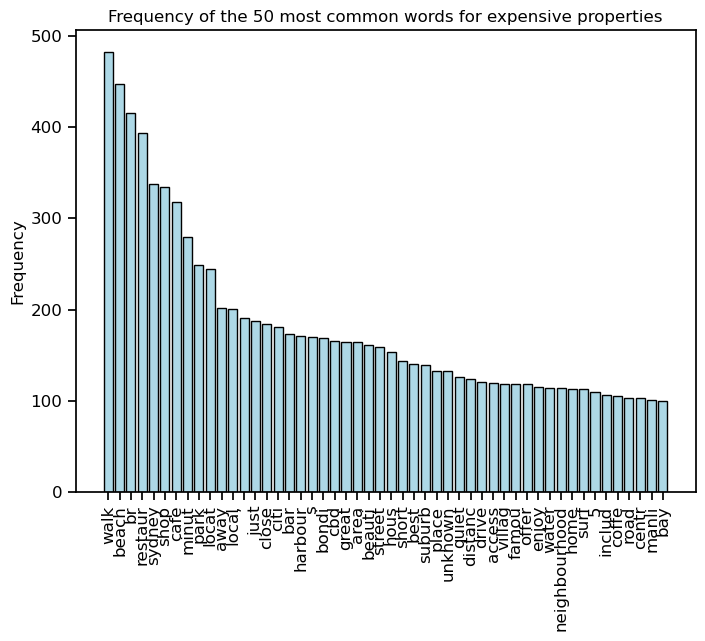

In [37]:
n = 50
frequency_data = pd.Series(dict(frequency.most_common()[:n]))

fig, ax = plt.subplots(figsize=(8, 6))
plt.bar(np.arange(0, n), frequency_data, color='lightblue', edgecolor='black')
plt.xticks(np.arange(0, n), frequency_data.index, rotation=90)
plt.ylabel('Frequency')
plt.title('Frequency of the {} most common words for expensive properties'.format(n));

In [38]:
df_199 = df[df['price'] <= 312]

In [39]:
df_199['nei_overview_tokens'] = df_199['neighborhood_overview'].apply(process_text)
frequency = nltk.FreqDist()
for words in df_199['nei_overview_tokens']:
    for word in np.unique(words):
        frequency[word] += 1
        
print(frequency.most_common()[:10])   

[('walk', 1364), ('restaur', 1218), ('br', 1156), ('sydney', 1114), ('cafe', 1052), ('shop', 1051), ('beach', 877), ('park', 843), ('locat', 772), ('minut', 742)]


/var/folders/3c/zgwqp6yn5dlg18j9wfwc_lpm0000gn/T/ipykernel_51569/4048798983.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_199['nei_overview_tokens'] = df_199['neighborhood_overview'].apply(process_text)


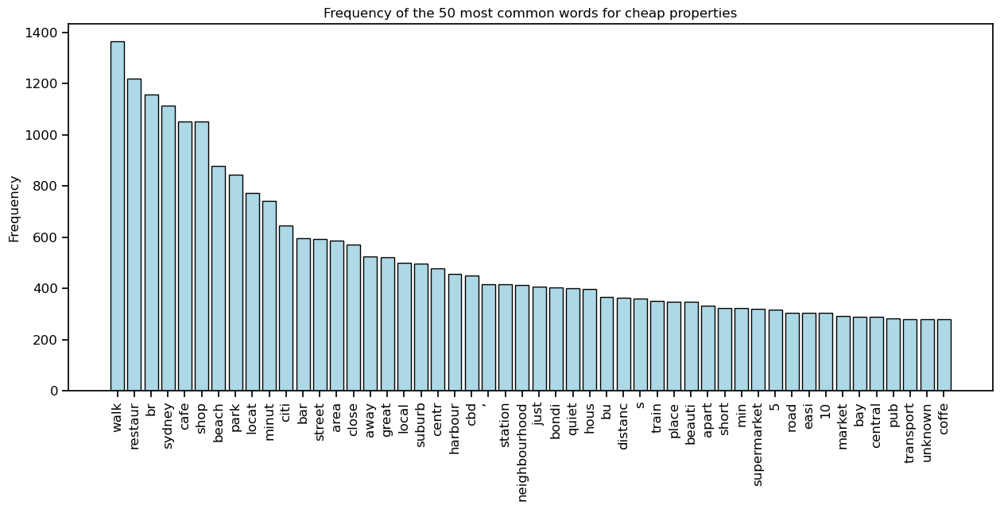

In [40]:
n = 50
frequency_data = pd.Series(dict(frequency.most_common()[:n]))

fig, ax = plt.subplots(figsize=(15, 6))
plt.bar(np.arange(0, n), frequency_data, color='lightblue', edgecolor='black')
plt.xticks(np.arange(0, n), frequency_data.index, rotation=90)
plt.ylabel('Frequency')
plt.title('Frequency of the 50 most common words for cheap properties');

In [41]:
# since it's hard to identify the most impactful tokens, we further look at the top 20 tokens for price over 700

In [42]:
df_700 =  df_200[df_200['price'] > 700] 
df_700['nei_overview_tokens'] = df_700['neighborhood_overview'].apply(process_text)
frequency = nltk.FreqDist()
for words in df_700['nei_overview_tokens']:
    for word in np.unique(words):
        frequency[word] += 1
        
print(frequency.most_common()[:10])   

[('beach', 144), ('walk', 130), ('br', 115), ('restaur', 108), ('shop', 99), ('sydney', 93), ('minut', 86), ('cafe', 85), ('park', 70), ('away', 62)]


/var/folders/3c/zgwqp6yn5dlg18j9wfwc_lpm0000gn/T/ipykernel_51569/817187363.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_700['nei_overview_tokens'] = df_700['neighborhood_overview'].apply(process_text)


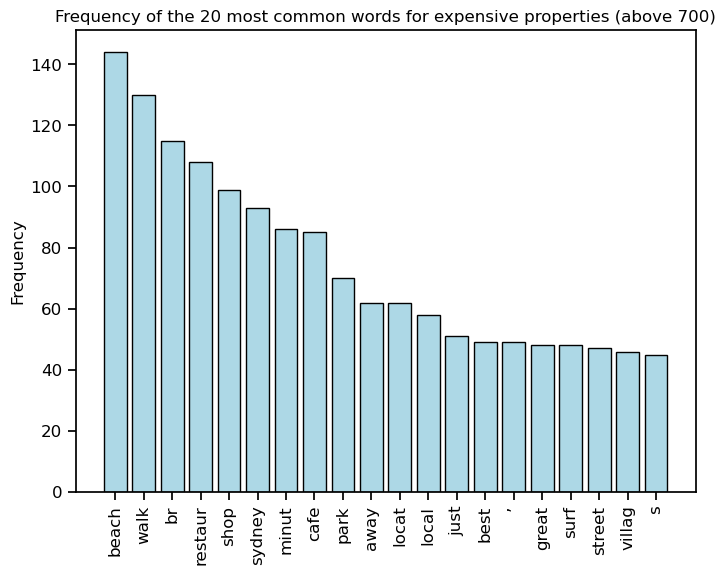

In [43]:
n = 20
frequency_data = pd.Series(dict(frequency.most_common()[:n]))

fig, ax = plt.subplots(figsize=(8, 6))
plt.bar(np.arange(0, n), frequency_data, color='lightblue', edgecolor='black')
plt.xticks(np.arange(0, n), frequency_data.index, rotation=90)
plt.ylabel('Frequency')
plt.title('Frequency of the 20 most common words for expensive properties (above 700)');

feature engineering:
contain 'beach','minut','away','local','just','surf','best','villag','close' --> 1 otherwise 0

new vairable: expensive_nei_tokens

In [44]:
train.columns

Index(['price', 'neighborhood_overview', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_identity_verified', 'neighbourhood_cleansed',
       'latitude', 'longitude', 'property_type', 'room_type', 'accommodates',
       'bedrooms', 'beds', 'amenities', 'minimum_nights', 'maximum_nights',
       'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month',
       'hs_year', '1 bedroom', '2 bedroom', '3 bedroom', '4 bedroom',
       '5 bedroom', '6 bedroom', 'greater or equal 7 bedroom'],
      dtype='object')

## host_since

In [45]:
year_num = pd.DataFrame(df['hs_year'].value_counts().sort_index())

In [46]:
year_price = pd.DataFrame(df.groupby(by=["hs_year"]).mean().reset_index())

In [47]:
trace1 = go.Bar(
    x = year_num.index,
    y=year_num['hs_year'],
    name='Number of listings',
)

trace2 = go.Scatter(
    x=year_price['hs_year'],
    y=year_price['price'],
    name='Price (AUD)',
    xaxis='x', 
    yaxis='y2'
)
 
    
data = [trace1, trace2]

layout = go.Layout(
    title='Listings by Year',
    
    xaxis=dict(
        title='Year'),
    
    yaxis=dict(
        title='Number of listings'
    ),
    yaxis2=dict(anchor='x', overlaying='y', side='right',title = 'Average price (AUD)'),
    
)

fig = go.Figure(data=data, layout=layout)
fig.show()

not include in the model

In [48]:
# top 10 location with the most listings
loca_10 = df['host_location'].value_counts().head(11)

In [49]:
loca_10

Sydney             1253
Unknown             637
New South Wales     399
Manly               104
Bondi Beach          98
Padstow              68
Australia            66
Avalon Beach         48
Coogee               39
Surry Hills          37
Melbourne            35
Name: host_location, dtype: int64

In [50]:
# locations with the highest price
hp_loc = df["price"].groupby(df["host_location"]).mean().reset_index()
hp_loc = hp_loc.sort_values(by = 'price', ascending = False, axis=0)

In [51]:
# we can divide locations by twe parts: if above 200; create dummy 
fig = px.bar(hp_loc, x="host_location", y="price",title= 'Average price by Location')
fig.update_xaxes(title='Location')
fig.update_yaxes(title='Average price (AUD)')
fig.write_image("locationVSprice.png") 
fig.show()

not include in the model

## min / max nights

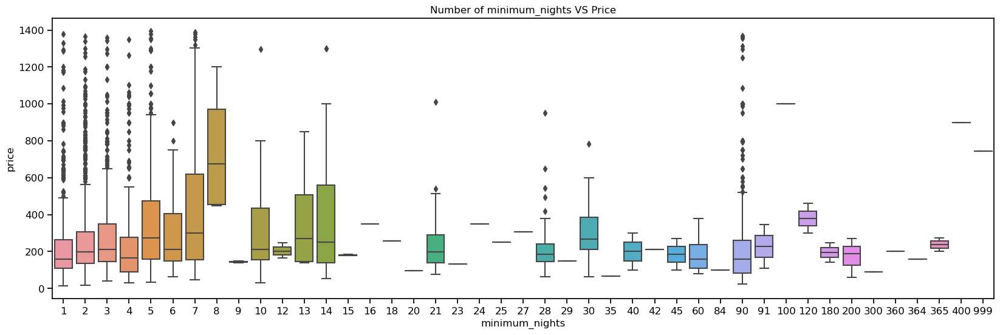

In [52]:
data = pd.concat([df['minimum_nights'], df['price']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="minimum_nights", y="price", data=data).set_title('Number of minimum_nights VS Price')

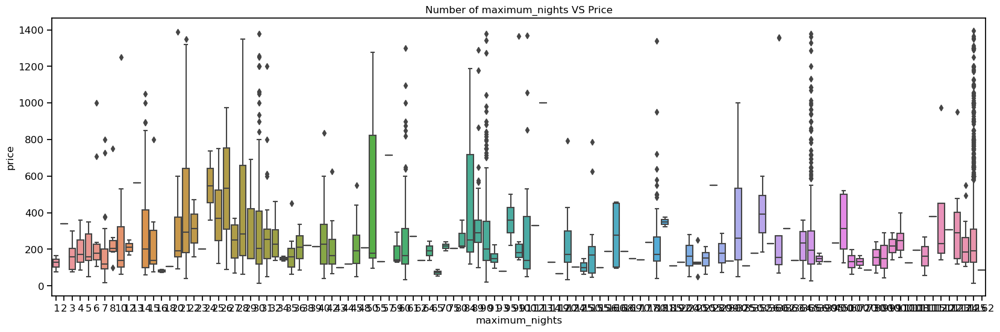

In [53]:
data = pd.concat([df['maximum_nights'], df['price']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="maximum_nights", y="price", data=data).set_title('Number of maximum_nights VS Price')

## host_response_time

In [54]:
res_time = pd.DataFrame(df.groupby(by=["host_response_time"]).mean().reset_index())

In [55]:
res_time

,host_response_time,price,host_response_rate,host_acceptance_rate,latitude,longitude,accommodates,bedrooms,beds,minimum_nights,...,review_scores_value,reviews_per_month,hs_year,1 bedroom,2 bedroom,3 bedroom,4 bedroom,5 bedroom,6 bedroom,greater or equal 7 bedroom
0,Unknown,328.893130,1.000000,0.654885,-33.841923,151.237796,4.114504,2.114504,2.419847,48.664122,...,4.702443,0.532214,2015.152672,0.450382,0.229008,0.129771,0.137405,0.053435,0.000000,0.000000
1,a few days or more,237.511450,0.097481,0.515496,-33.860011,151.199788,3.740458,1.908397,2.236641,72.083969,...,4.624198,0.291985,2015.435115,0.458015,0.290076,0.122137,0.076336,0.030534,0.007634,0.000000
2,within a day,350.281250,0.901847,0.672131,-33.833561,151.229624,4.161932,2.034091,2.534091,28.571023,...,4.688665,0.672898,2015.073864,0.375000,0.275568,0.173295,0.085227,0.042614,0.005682,0.000000
3,within a few hours,302.765991,0.982871,0.805585,-33.830540,151.213986,3.742590,1.764431,2.276131,16.349454,...,4.694134,0.966069,2014.709828,0.430577,0.266771,0.149766,0.065523,0.014041,0.003120,0.000000
4,within an hour,250.010565,0.989993,0.942211,-33.853626,151.186036,3.712204,1.599271,2.162113,9.901639,...,4.627658,1.549373,2015.977049,0.500546,0.259381,0.106011,0.038251,0.016029,0.004372,0.000364


In [56]:
# create dummy for each one 
fig = px.bar(res_time, x="host_response_time", y="price",title= 'Average price by Response Time')
fig.update_xaxes(categoryorder='total descending',title='Host response time')
fig.update_yaxes(title='Average price (AUD)')
fig.show()

feature engineering: 
get dummy for each

In [57]:
rs_time_dum = pd.get_dummies(train["host_response_time"], drop_first=True) # basic: unknown 

In [58]:
train = pd.concat([train, rs_time_dum],axis=1)

In [59]:
rs_time_dum = pd.get_dummies(test["host_response_time"], drop_first=True)

In [60]:
test = pd.concat([test, rs_time_dum],axis=1)

## host_response_rate

In [61]:
## host_response_rate: the higher the rate, the higher the price 
fig = px.scatter(df, x="host_response_rate", y="price",title= 'Average price by Response Rate' )
fig.update_xaxes(title='Host response rate')
fig.update_yaxes(title='Price (AUD)')
fig.show()

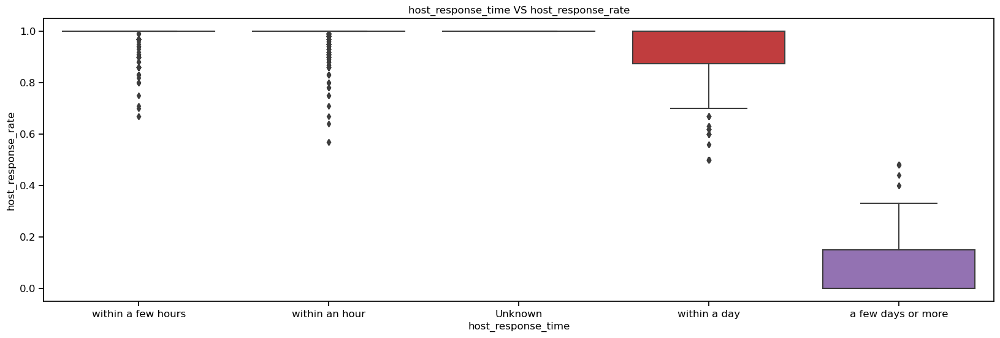

In [62]:
data = pd.concat([df['host_response_time'], df['host_response_rate']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="host_response_time", y="host_response_rate", data=data).set_title('host_response_time VS host_response_rate')

## host_acceptance_rate

In [63]:
# we can divide locations by twe parts: if above 200; create dummy 
fig = px.scatter(df, x="host_acceptance_rate", y="price",title= 'Price VS Acceptance Rate')
fig.update_xaxes(title='host_acceptance_rate')
fig.update_yaxes(title='price (AUD)')
fig.show()

## host_is_superhost

In [64]:
superho = pd.DataFrame(df.groupby(by=["host_is_superhost"]).mean().reset_index())

In [65]:
superho

,host_is_superhost,price,host_response_rate,host_acceptance_rate,latitude,longitude,accommodates,bedrooms,beds,minimum_nights,...,review_scores_value,reviews_per_month,hs_year,1 bedroom,2 bedroom,3 bedroom,4 bedroom,5 bedroom,6 bedroom,greater or equal 7 bedroom
0,f,275.413424,0.936016,0.842506,-33.851396,151.196968,3.854338,1.758301,2.283470,20.308818,...,4.583324,1.067712,2015.662978,0.458765,0.269904,0.125312,0.058551,0.024277,0.004284,0.000357
1,t,255.560467,0.989983,0.944787,-33.840022,151.195395,3.575480,1.533778,2.085071,5.546289,...,4.792469,1.856922,2015.618849,0.513761,0.243536,0.108424,0.034195,0.009174,0.004170,0.000000


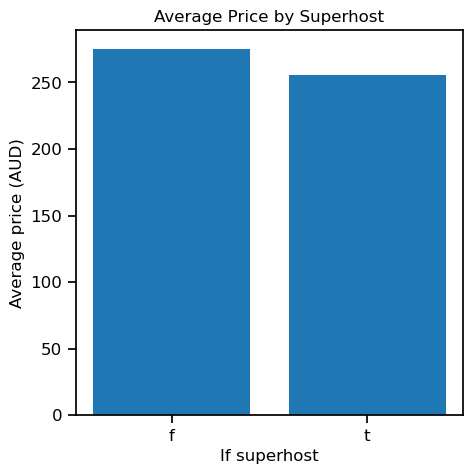

In [66]:
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(superho["host_is_superhost"], superho["price"])
 
plt.xlabel("If superhost")
plt.ylabel("Average price (AUD)")
plt.title("Average Price by Superhost")
plt.show()

not include in the model 

## host_identity_verified

In [67]:
## host_identity_verified
iden = pd.DataFrame(df.groupby(by=["host_identity_verified"]).mean().reset_index())

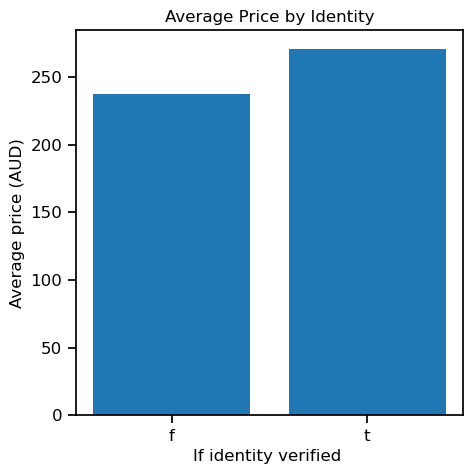

In [68]:
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(iden["host_identity_verified"], iden["price"])
 
plt.xlabel("If identity verified ")
plt.ylabel("Average price (AUD)")
plt.title("Average Price by Identity")
plt.show()

not include in the model 

## neighbourhood_cleansed

In [69]:
# top 10 location with the most listings
loca_10 = df['neighbourhood_cleansed'].value_counts().head(11)
loca_10

Sydney              979
Waverley            427
Randwick            275
Pittwater           258
Manly               229
Warringah           173
North Sydney        167
Woollahra           148
Leichhardt          132
Marrickville        106
Sutherland Shire    104
Name: neighbourhood_cleansed, dtype: int64

In [70]:
# with the highest price
hp_nei = df["price"].groupby(df["neighbourhood_cleansed"]).mean().reset_index()
hp_nei = hp_nei.sort_values(by = 'price', ascending = False, axis=0)

In [71]:
# we can divide locations by twe parts: if above 200; create dummy 
fig = px.bar(hp_nei, x="neighbourhood_cleansed", y="price",title= 'Average price by Neighbourhood')
fig.update_xaxes(title='Neighbourhood')
fig.update_yaxes(title='Average price (AUD)')
fig.write_image("locationVSprice.png") 
fig.show()

In [72]:
# sydney is CBD

feature engineering:  
top five neibourhoods have ave price above 312, if in these neibourhoods --> 1 else 0

new variable: expensive_neighbourhood_tokens

In [73]:
train = train.reset_index()

In [74]:
List_all = ['Pittwater','Mosman',"Manly",'Warringah','Waverley']

a = []
for i in range(len(train)):
    if list(set(List_all).intersection(set([train['neighbourhood_cleansed'][i]]))) != []:
        a.append(1)
    else:
        a.append(0)
        
# create a new dummy variable 
train["expensive_neighbourhood_tokens"] = a

In [75]:
train["expensive_neighbourhood_tokens"].value_counts()

0    2847
1    1153
Name: expensive_neighbourhood_tokens, dtype: int64

In [76]:
a = []
for i in range(len(test)):
    if list(set(List_all).intersection(set([test['neighbourhood_cleansed'][i]]))) != []:
        a.append(1)
    else:
        a.append(0)
        
# create a new dummy variable 
test["expensive_neighbourhood_tokens"] = a

In [77]:
test["expensive_neighbourhood_tokens"].value_counts()

0    1447
1     553
Name: expensive_neighbourhood_tokens, dtype: int64

## amenities 

In [78]:
cheap_properties = df[df['price'] <=  128.25]

freq_cheap = nltk.FreqDist()
for words in cheap_properties['amenities']:
    wordlist = ast.literal_eval(words)
    for word in np.unique(wordlist):
        freq_cheap[word] += 1
        

In [79]:
expensive_properties = df[df['price'] >= 312]

freq_expensive = nltk.FreqDist()
for words in expensive_properties['amenities']:
    wordlist = ast.literal_eval(words)
    for word in np.unique(wordlist):
        freq_expensive[word] += 1

In [80]:
n = 100
frequency_data = pd.Series(dict(freq_cheap.most_common()[:n]))
n_cheap_properties = len(cheap_properties)
percentage_data_cheap = frequency_data/n_cheap_properties * 100
percentage_data_cheap

Smoke alarm                 95.413759
Essentials                  94.516451
Long term stays allowed     90.129611
Hangers                     89.930209
Wifi                        89.132602
                              ...    
Window guards                3.190429
Nespresso machine            3.190429
High chair                   3.190429
Pack ’n play/Travel crib     3.090728
Children’s dinnerware        3.090728
Length: 100, dtype: float64

In [81]:
n = 100
frequency_data = pd.Series(dict(freq_expensive.most_common()[:n]))
n_expensive_properties = len(expensive_properties)
percentage_data_expensive = frequency_data/n_expensive_properties * 100
percentage_data_expensive

Smoke alarm                   94.705295
Kitchen                       93.506494
Wifi                          92.707293
Essentials                    90.809191
Iron                          89.610390
                                ...    
Keypad                         5.494505
Private garden or backyard     5.294705
Stainless steel oven           4.895105
Free washer – In building      4.895105
Piano                          4.795205
Length: 100, dtype: float64

In [82]:
cheap_properties_without_replica = percentage_data_cheap[~percentage_data_cheap.index.isin(percentage_data_expensive.index)]
cheap_properties_without_replica.to_frame()

,0
Lock on bedroom door,27.318046
Shared patio or balcony,10.269192
Smart lock,8.873380
Cleaning before checkout,8.175474
Shared fenced garden or backyard,5.184447
Shared pool,4.685942
Paid washer – In building,3.988036
Clothing storage: closet,3.489531
Pocket wifi,3.389831
Paid dryer – In building,3.290130


In [83]:
expensive_properties_without_replica =percentage_data_expensive[~percentage_data_expensive.index.isin(percentage_data_cheap.index)]
expensive_properties_without_replica.to_frame()

,0
Waterfront,13.986014
Beachfront,10.789211
Babysitter recommendations,7.992008
Gym,7.792208
Private pool,7.192807
Outdoor shower,6.893107
Fire pit,6.393606
Central heating,6.093906
Sound system,5.994006
Private garden or backyard,5.294705


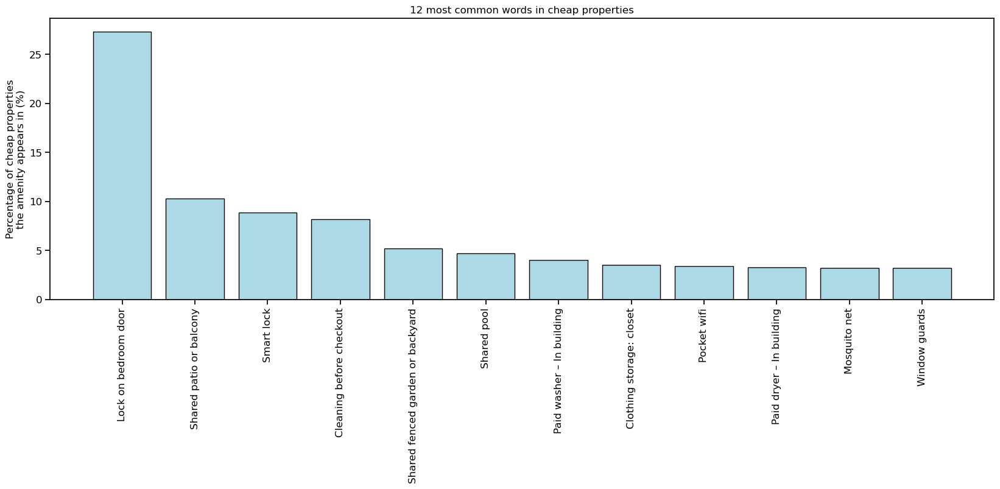

In [84]:
n = cheap_properties_without_replica.size
fig, ax = plt.subplots(figsize=(20, 6))
plt.bar(np.arange(0,n ), cheap_properties_without_replica, color='lightblue', edgecolor='black')
plt.xticks(np.arange(0, n), cheap_properties_without_replica.index, rotation=90)
plt.ylabel('Percentage of cheap properties\nthe amenity appears in (%)')
plt.title('{} most common words in cheap properties'.format(n));

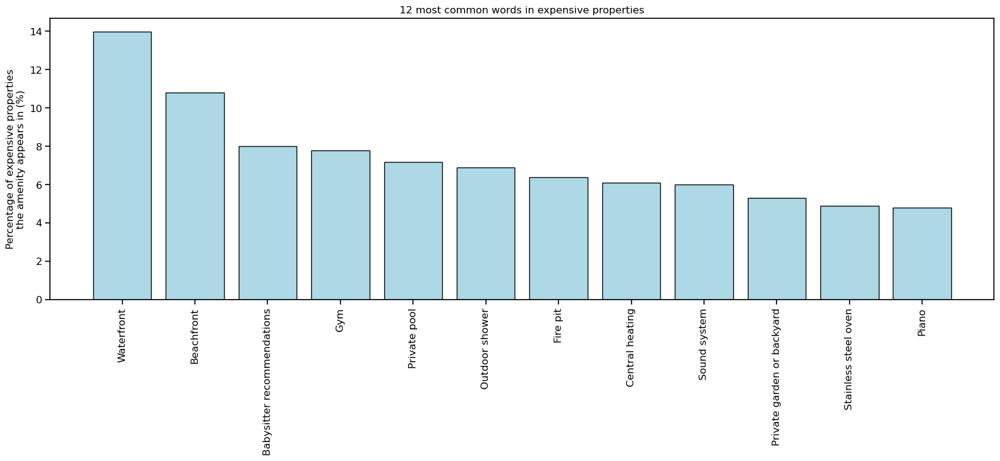

In [85]:
n = expensive_properties_without_replica.size
fig, ax = plt.subplots(figsize=(20, 6))
plt.bar(np.arange(0,n ), expensive_properties_without_replica, color='lightblue', edgecolor='black')
plt.xticks(np.arange(0, n), expensive_properties_without_replica.index, rotation=90)
plt.ylabel('Percentage of expensive properties\nthe amenity appears in (%)')
plt.title('{} most common words in expensive properties'.format(n));

feature engineering:
if contain BBQ grill, private entrance, private patio and balcony, bathtub, cable TV --> 1 otherwise 0

new variable "high_price_amen_tokens"

In [86]:
def get_dummy_for_expensive_property_amenities(row):
  for element in row['amenities'].split(','):
    element= element.strip('[" " "]')
    if element in str(expensive_properties_without_replica.index) :
      return 1;
    else:
      return 0;

def get_dummy_for_cheap_property_amenities(row):
  for element in row['amenities'].split(','):
    element= element.strip('[" " "]')
    if element in str(cheap_properties_without_replica.index) :
      return 1;
    else:
      return 0;



In [87]:
train["expensive_properties_amenities"] = train.apply(lambda row: get_dummy_for_expensive_property_amenities(row),  axis=1)
test["expensive_properties_amenities"] = test.apply(lambda row: get_dummy_for_expensive_property_amenities(row),  axis=1)

train["cheap_properties_amenities"] = train.apply(lambda row: get_dummy_for_cheap_property_amenities(row),  axis=1)
test["cheap_properties_amenities"] = test.apply(lambda row: get_dummy_for_cheap_property_amenities(row),  axis=1)

In [88]:
train["expensive_properties_amenities"].value_counts()

0    3952
1      48
Name: expensive_properties_amenities, dtype: int64

In [89]:
train["cheap_properties_amenities"].value_counts()

0    3954
1      46
Name: cheap_properties_amenities, dtype: int64

In [90]:
# with the highest rating
avg_score = df["review_scores_location"].groupby(df["neighbourhood_cleansed"]).mean().reset_index()
avg_score = avg_score.sort_values(by = 'review_scores_location', ascending = False, axis=0)

In [91]:
# we can divide locations by twe parts: if above 200; create dummy 
fig = px.bar( avg_score ,x="neighbourhood_cleansed", y="review_scores_location",title= 'Avarage score by Neighbourhood')
fig.update_xaxes(title='Neighbourhood')
fig.update_yaxes(title='Average rating')
fig.write_image("locationVSprice.png") 
fig.show()

**interaction variable for neighborhood and rating**

In [92]:
train['interaction_rating_neighborhood'] = train['expensive_neighbourhood_tokens']*train['review_scores_location']
train['interaction_rating_neighborhood']

0       0.0
1       0.0
2       0.0
3       5.0
4       0.0
       ... 
3995    5.0
3996    0.0
3997    5.0
3998    0.0
3999    0.0
Name: interaction_rating_neighborhood, Length: 4000, dtype: float64

In [93]:
test['interaction_rating_neighborhood'] = test['expensive_neighbourhood_tokens']*test['review_scores_location']

## accommodates & beds & bedrooms

In [94]:
df["beds"].describe()

count    4000.000000
mean        2.224000
std         1.559145
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        21.000000
Name: beds, dtype: float64

In [95]:
df["accommodates"].describe()

count    4000.000000
mean        3.770750
std         2.238403
min         1.000000
25%         2.000000
50%         4.000000
75%         5.000000
max        16.000000
Name: accommodates, dtype: float64

In [96]:
df["bedrooms"].describe()

count    4000.000000
mean        1.691000
std         1.106944
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         7.000000
Name: bedrooms, dtype: float64

In [97]:
df["beds"].value_counts().head(10)

1.0     1724
2.0      987
3.0      606
4.0      359
5.0      156
6.0      104
7.0       34
8.0       12
9.0        8
10.0       3
Name: beds, dtype: int64

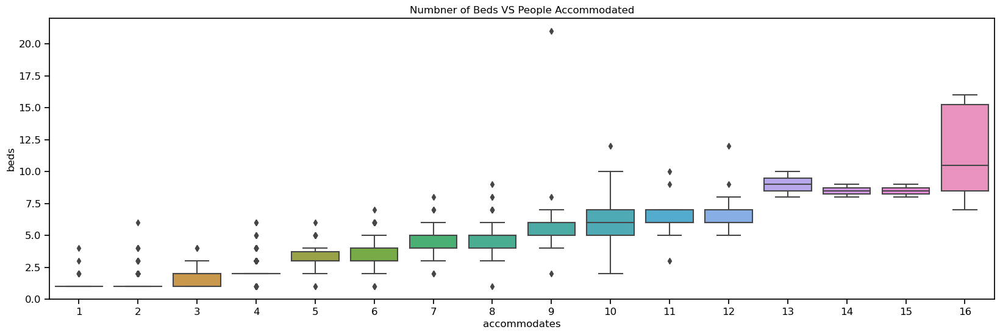

In [98]:
data = pd.concat([df['beds'], df['accommodates']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="accommodates", y="beds", data=data).set_title('Numbner of Beds VS People Accommodated')

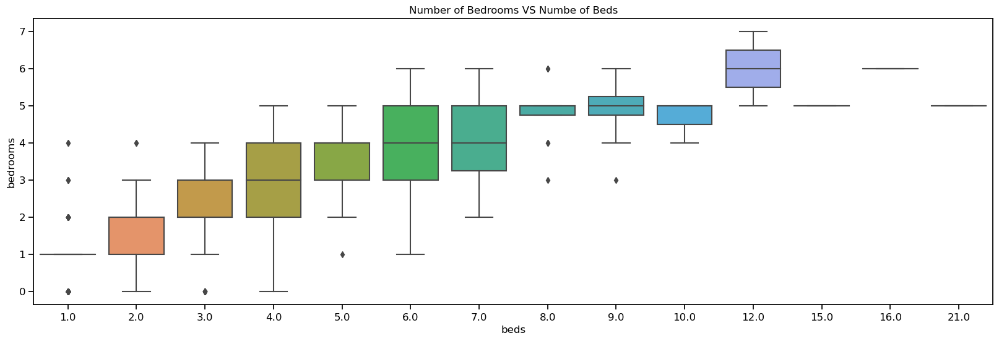

In [99]:
data = pd.concat([df['beds'], df['bedrooms']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="beds", y="bedrooms", data=data).set_title('Number of Bedrooms VS Numbe of Beds')

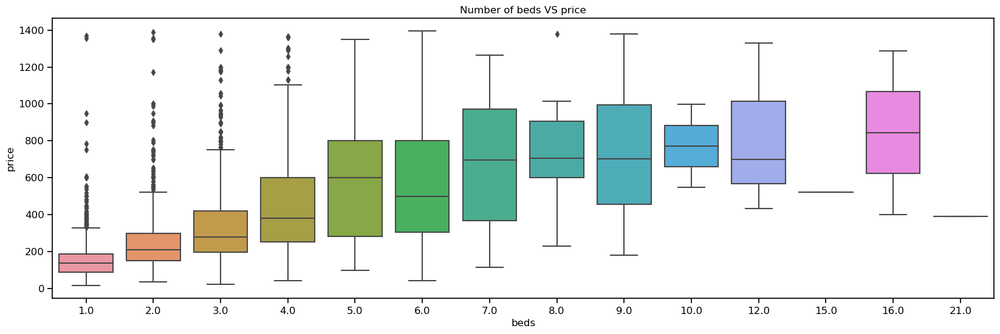

In [100]:
data = pd.concat([df['beds'], df['price']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="beds", y="price", data=data).set_title('Number of beds VS price')

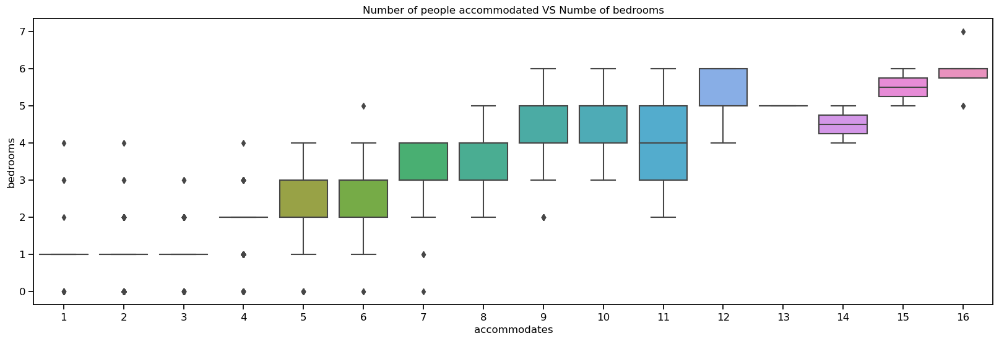

In [101]:
data = pd.concat([df['accommodates'], df['bedrooms']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="accommodates", y="bedrooms", data=data).set_title('Number of people accommodated VS Numbe of bedrooms')

##is there any relation between the price of a property and the avarage number for beds in a bedroom?

In [102]:
def get_ratio(row):
  if row.bedrooms == 0:
    return 0;
  else:
    ratio = row.beds/row.bedrooms
    return ratio

def get_dummy_for_ratio(row):
  if row.bedrooms == 0:
    return 0;
  elif row.beds/row.bedrooms >= 3:
    return 1;
  else:
    return 0;


In [103]:
tmp_df = df.copy()

In [104]:
tmp_df['beds_per_bedroom'] = tmp_df.apply(lambda row: get_ratio(row),  axis=1)
tmp_df['beds_per_bedroom'] 

0       1.0
1       1.5
2       2.0
3       1.0
4       1.5
       ... 
3995    2.0
3996    1.0
3997    2.0
3998    1.0
3999    1.0
Name: beds_per_bedroom, Length: 4000, dtype: float64

In [105]:
tmp_df['beds_per_bedroom'].describe()

count    4000.000000
mean        1.182891
std         0.588710
min         0.000000
25%         1.000000
50%         1.000000
75%         1.400000
max         6.000000
Name: beds_per_bedroom, dtype: float64

In [106]:
# with the highest price
price_per_occupancy = tmp_df["price"].groupby(tmp_df["beds_per_bedroom"]).mean().reset_index()
price_per_occupancy = price_per_occupancy.sort_values(by = 'beds_per_bedroom', ascending = True, axis=0)
price_per_occupancy.head(50)

,beds_per_bedroom,price
0,0.000000,165.828358
1,0.250000,704.500000
2,0.333333,404.500000
3,0.500000,300.592593
4,0.666667,432.500000
5,0.750000,685.000000
6,0.800000,1249.000000
7,1.000000,241.229380
8,1.166667,865.571429
9,1.200000,778.833333


In [107]:
fig = px.bar(price_per_occupancy, x="beds_per_bedroom", y="price",title= "Average price by bedroom's occupancy")
fig.update_xaxes(title='ratio bed/bedrooms')
fig.update_yaxes(title='Average price (AUD)')
fig.write_image("priceVSOccupancy.png") 
fig.show()

**create a variable: if ratio >= 3 high_occupancy_per_bedroom --> 1 otherwise 0**

In [108]:
train["high_occupancy_per_bedroom"]= train.apply(lambda row: get_ratio(row),  axis=1)
test["high_occupancy_per_bedroom"]= test.apply(lambda row: get_ratio(row),  axis=1)

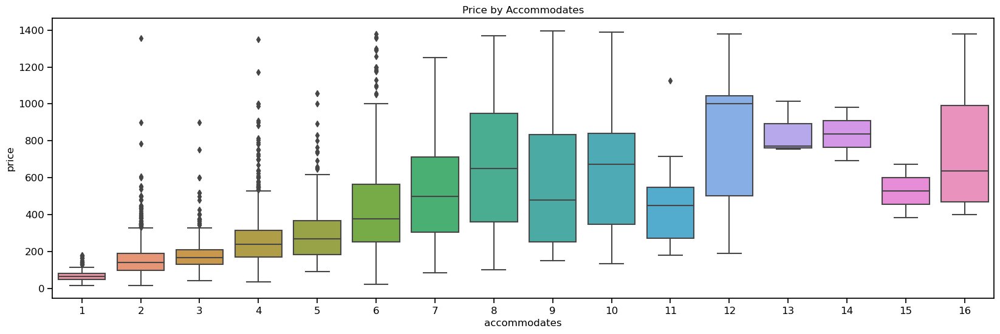

In [109]:
data = pd.concat([df['price'], df['accommodates']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="accommodates", y="price", data=data).set_title('Price by Accommodates')

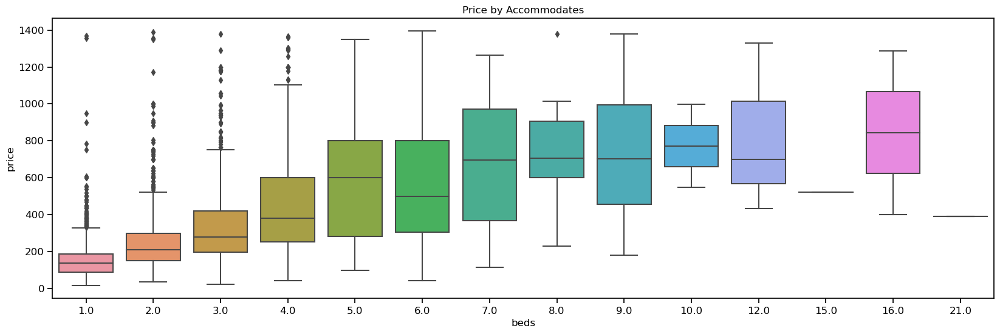

In [110]:
data = pd.concat([df['price'], df['beds']], axis=1)
f, ax = plt.subplots(figsize=(20, 6))
fig = sns.boxplot(x="beds", y="price", data=data).set_title('Price by Accommodates')

## room_type (vs  property_type)

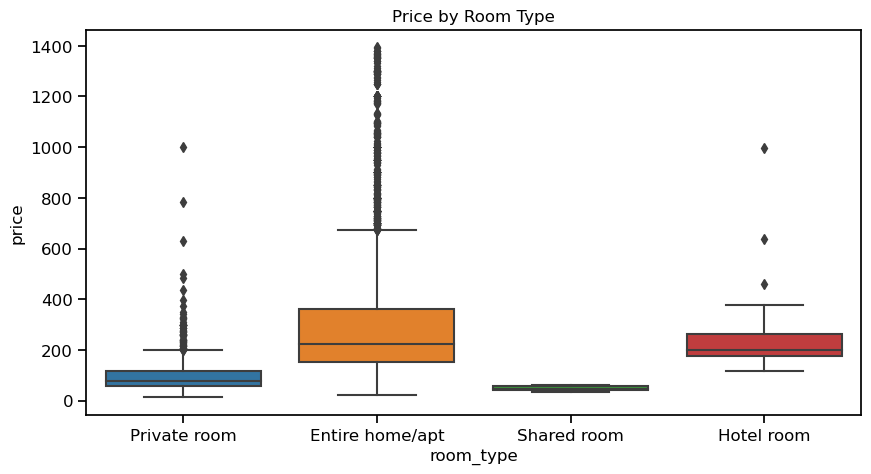

In [111]:
plt.figure(figsize=(10,5))
sns.boxplot(x='room_type', y='price',data=df).set_title('Price by Room Type')
plt.show()

feature enigineering:  
get dummies

this variable gets dropped since it is replica, only less detailed, of property_type

In [112]:
train = train.drop(['room_type'], axis = 1)
test = test.drop(['room_type'], axis = 1)

## property_type

In [113]:
# avarge price per property type
avg_price_per_propT = df["price"].groupby(df["property_type"]).mean().reset_index()
avg_price_per_propT = avg_price_per_propT.sort_values(by = 'price', ascending = False, axis=0)
avg_price_per_propT

,property_type,price
19,Entire villa,572.285714
12,Entire home,539.761347
21,Island,500.000000
42,Room in aparthotel,470.280000
20,Farm stay,464.666667
9,Entire cottage,389.772727
1,Boat,385.000000
18,Entire vacation home,367.200000
46,Room in serviced apartment,339.800000
17,Entire townhouse,318.438202


In [114]:
expensive_pro = avg_price_per_propT[avg_price_per_propT['price'] >= 312]

In [115]:
# we can divide locations by twe parts: if above 200; create dummy 
fig = px.bar(avg_price_per_propT, x="property_type", y="price",title= 'Average price by property_type')
fig.update_xaxes(title='property_type')
fig.update_yaxes(title='Average price (AUD)')
fig.write_image("propTypeVSprice.png") 
fig.show()

In [116]:
expensive_pro['property_type']

19                  Entire villa
12                   Entire home
21                        Island
42            Room in aparthotel
20                     Farm stay
9                 Entire cottage
1                           Boat
18          Entire vacation home
46    Room in serviced apartment
17              Entire townhouse
Name: property_type, dtype: object

In [117]:
cheap_pro = avg_price_per_propT[avg_price_per_propT['price'] <= 128.25]

In [118]:
cheap_pro['property_type']

2                                   Bus
29              Private room in cottage
30          Private room in guest suite
34            Private room in houseboat
23    Private room in bed and breakfast
4                       Casa particular
22                         Private room
35                 Private room in loft
24             Private room in bungalow
36          Private room in rental unit
0                                  Barn
28                Private room in condo
39            Private room in townhouse
31           Private room in guesthouse
32                 Private room in home
40                Private room in villa
27      Private room in casa particular
48                Shared room in hostel
38            Private room in tiny home
49           Shared room in rental unit
47     Shared room in bed and breakfast
26            Private room in camper/rv
Name: property_type, dtype: object

feature engineering:  

new varaible: expensive_property_type (0 or 1)
              cheap_property_type   (0 or 1)

            

In [119]:
def get_dummy_for_expensive_property_type(row):
  if row['property_type'] in expensive_pro['property_type'].astype(str).values.tolist() :
    return 1;
  else:
    return 0;

def get_dummy_for_cheap_property_type(row):
   if row.property_type in cheap_pro['property_type'].astype(str).values.tolist() :
    return 1;
   else:
    return 0;




In [120]:
train["expensive_property_type"] = train.apply(lambda row: get_dummy_for_expensive_property_type(row),  axis=1)

In [121]:
train["expensive_property_type"].value_counts()

0    3112
1     888
Name: expensive_property_type, dtype: int64

In [122]:
train["cheap_property_type"] =  train.apply(lambda row:get_dummy_for_cheap_property_type(row),  axis=1)

In [123]:
test["expensive_property_type"] =  test.apply(lambda row: get_dummy_for_expensive_property_type(row),  axis=1)

In [124]:
test["cheap_property_type"] =  test.apply(lambda row:get_dummy_for_cheap_property_type(row),  axis=1)

# Variables Pre-selection 

In [125]:
train_numerical = train[['host_response_rate','host_acceptance_rate','accommodates','beds',
                        'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value','reviews_per_month','price']]

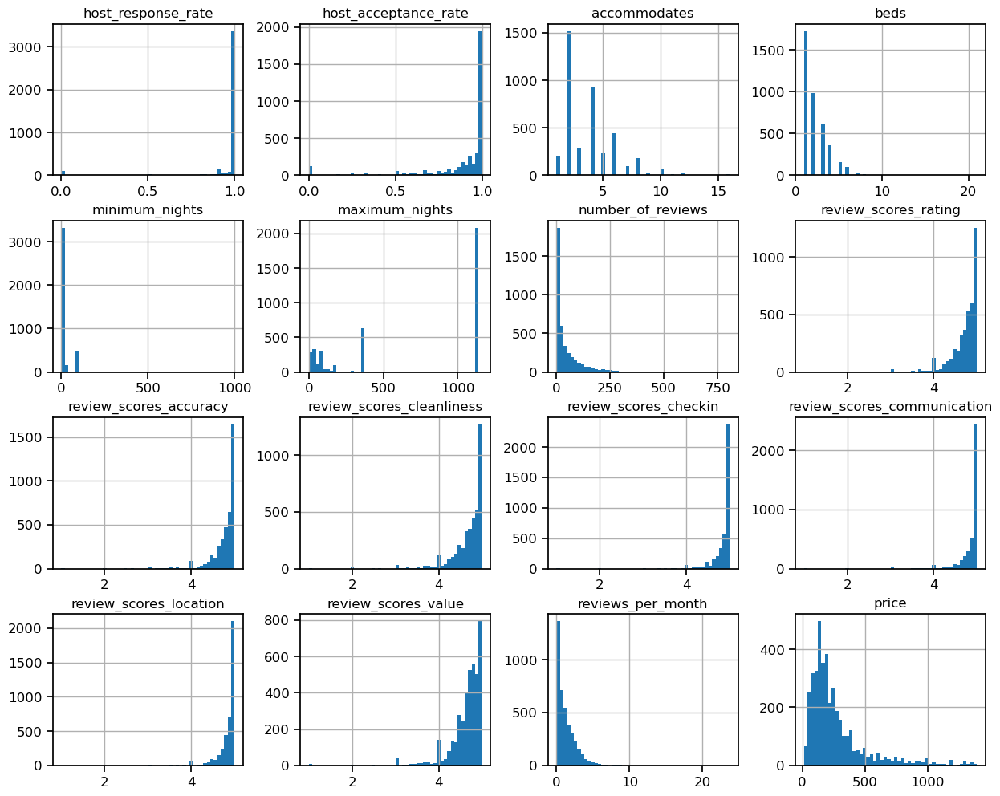

In [126]:
train_numerical.hist(bins=50, figsize=(15, 12), layout=(4, 4));

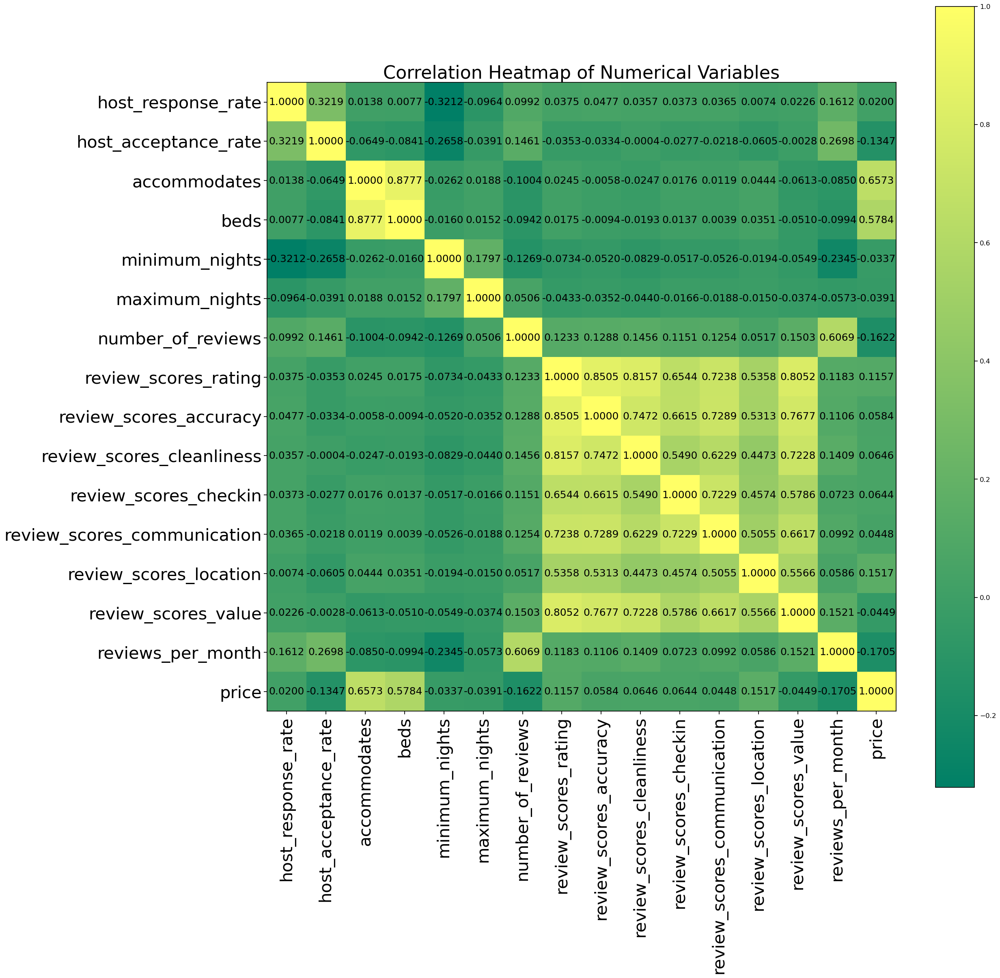

In [127]:
# draw a heat map for numerical variables in train set 

corr = train_numerical.corr()
n_var = len(corr) # Number of variables

plt.figure(figsize = (25,25)) # Change the width and height

# Plot the heatmap
plt.imshow(corr, cmap = 'summer')

plt.xticks(range(n_var), corr.columns, fontsize = 30)
plt.xticks(rotation=90)
plt.yticks(range(n_var), corr.columns, fontsize = 30)

for i in range(n_var):
    for j in range(n_var):
        #              format to 4 decimal places  ,  horizonta/vertical align center  
        plt.text(i, j, '{:.4f}'.format(corr.iloc[i, j]), ha="center", va="center", color="k", fontsize = 18)

plt.colorbar()

plt.title('Correlation Heatmap of Numerical Variables', fontsize = 32)
plt.show()


## <font color = '#e64626'><a id='feature_engineering'>3. Feature Engineering</a></font>

included in EDA

## <font color = '#e64626'><a id='methodology'>4. Methodology</a></font>

## scaling

In [128]:
train_p = train.copy()
test_p = test.copy()

In [129]:
train_nu = train_p[['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month'
                   
                   ]]

In [130]:
test_nu = test_p[['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month']]

In [131]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(train_nu)

X_train_scaled = scaler.transform(train_nu)
X_test_scaled = scaler.transform(test_nu)

In [132]:
df_train = pd.DataFrame(X_train_scaled, columns = ['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month'])
df_test = pd.DataFrame(X_test_scaled, columns = ['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month'])

In [133]:
train_cate = train_p[[ 
       'a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens','expensive_property_type','cheap_property_type','1 bedroom', '2 bedroom', '3 bedroom', '4 bedroom',
       '5 bedroom', '6 bedroom', 'greater or equal 7 bedroom', 'expensive_properties_amenities',"cheap_properties_amenities",
                      'interaction_rating_neighborhood'
                   ]]

In [134]:
test_cate = test_p[[  
       'a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens','expensive_property_type','cheap_property_type','1 bedroom', '2 bedroom', '3 bedroom', '4 bedroom',
       '5 bedroom', '6 bedroom', 'greater or equal 7 bedroom', 'expensive_properties_amenities',"cheap_properties_amenities",
                      'interaction_rating_neighborhood'
                   ]]

In [135]:
train_new = pd.concat([train_cate, df_train, train_p['price']],axis=1)
test_new = pd.concat([test_cate, df_test],axis=1)

In [136]:
train_new.shape

(4000, 24)

In [137]:
test_new.shape

(2000, 23)

## train test split

In [138]:
from sklearn.model_selection import train_test_split

train_m, validation = train_test_split(train_new, train_size=0.7, random_state=1)

In [139]:
# x train
x_train = train_m.drop(['price'],axis = 1)

In [140]:
# y train
y_train  = train_m['price']

In [141]:
# x validation
x_vali = validation.drop(['price'],axis = 1)
# y validation
y_vali  = validation['price']

### <font color = '#e64626'><a id='model_2'>4.2. Model 1: *OLS*</a></font>

In [142]:
x_train_ols = x_train.copy()
x_train_ols.rename({'Hotel room': 'Hotel_room', 'Private room': 'Private_room','Shared room': 'Shared_room',
                 "1 bedroom": 'bedroom1','2 bedroom': 'bedroom2','3 bedroom': 'bedroom3',
                 '4 bedroom': 'bedroom4','5 bedroom': 'bedroom5','6 bedroom': 'bedroom6',
                 'a few days or more': 'a_few_days_or_more', 
                  'within a day': 'within_a_day','within a few hours': 'within_a_few_hours', 
                  'within an hour': 'within_an_hour','greater or equal 7 bedroom': 'greater_or_equal_7_bedroom'}, axis=1, inplace=True)

In [143]:
x_train_ols

,a_few_days_or_more,within_a_day,within_a_few_hours,within_an_hour,expensive_neighbourhood_tokens,expensive_property_type,cheap_property_type,bedroom1,bedroom2,bedroom3,...,greater_or_equal_7_bedroom,expensive_properties_amenities,cheap_properties_amenities,interaction_rating_neighborhood,host_response_rate,host_acceptance_rate,accommodates,review_scores_rating,review_scores_location,reviews_per_month
1850,0,0,0,1,1,0,0,1,0,0,...,0,0,0,5.00,0.277445,0.566364,-0.791176,0.761526,0.631934,-0.220473
2293,1,0,0,0,1,0,0,0,1,0,...,0,0,0,5.00,-5.525943,-3.898999,0.996036,0.761526,0.631934,-0.930560
576,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0.00,0.103344,-0.014133,0.102430,0.761526,0.631934,-0.829119
2731,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0.00,0.161378,0.477057,0.102430,0.761526,0.631934,-0.901577
1051,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0.00,0.277445,0.164482,0.102430,0.761526,-0.457645,0.083850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3839,0,1,0,0,0,0,1,1,0,0,...,0,0,0,0.00,0.277445,-1.666317,-1.237979,0.420020,0.457601,-0.459584
1096,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0.00,0.277445,0.343096,-0.791176,-0.657038,-0.980643,-0.517550
3980,0,0,0,1,1,1,0,0,1,0,...,0,0,0,5.00,0.277445,0.566364,0.102430,0.761526,0.631934,-0.901577
235,0,0,1,0,1,0,0,0,1,0,...,0,0,0,4.89,0.277445,0.075174,0.102430,-0.000296,0.152519,-0.292931


### 4.1.1 Base Model

In [144]:
import statsmodels.formula.api as smf

formula = 'y_train ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
ols = smf.ols(formula=formula, data=x_train_ols).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                y_train   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.590
Method:                 Least Squares   F-statistic:                     176.0
Date:                Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                        21:28:37   Log-Likelihood:                -17978.
No. Observations:                2800   AIC:                         3.600e+04
Df Residuals:                    2776   BIC:                         3.615e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                         157.6760     20.340      7.752      0.000     117.793     197.559
a_few_days_or_more                -87.3138     46.208     -1.890      0.059    -177.919       3.292
within_a_day                       10.2365     19.008      0.539      0.590     -27.034      47.507
within_a_few_hours                 11.4093     17.392      0.656      0.512     -22.693      45.511
within_an_hour                     17.8977     16.791      1.066      0.287     -15.026      50.822
expensive_neighbourhood_tokens    285.5973    169.782      1.682      0.093     -47.315     618.510
expensive_property_type            55.5836      9.141      6.081      0.000      37.660      73.507
cheap_property_type               -91.4197      8.866    -10.312      0.000    -108.804     -74.036
bedroom1                            9.4769     11.751      0.806      0.420     -13.565      32.518
bedroom2                           67.2054     13.578      4.950      0.000      40.581      93.829
bedroom3                          191.3258     18.312     10.448      0.000     155.419     227.233
bedroom4                          394.8204     24.378     16.196      0.000     347.019     442.622
bedroom5                          421.0636     33.343     12.628      0.000     355.684     486.443
bedroom6                          550.7750     58.550      9.407      0.000     435.969     665.581
greater_or_equal_7_bedroom         98.8940    154.918      0.638      0.523    -204.872     402.660
expensive_properties_amenities     91.2728     28.171      3.240      0.001      36.035     146.511
cheap_properties_amenities        -30.2911     25.973     -1.166      0.244     -81.219      20.637
interaction_rating_neighborhood   -41.7506     34.645     -1.205      0.228    -109.683      26.182
host_response_rate                 -4.1350      7.672     -0.539      0.590     -19.178      10.908
host_acceptance_rate              -12.7155      3.336     -3.811      0.000     -19.258      -6.173
accommodates                       22.1449      6.469      3.423      0.001       9.460      34.829
review_scores_rating                5.3380      3.382      1.579      0.115      -1.293      11.969
review_scores_location             16.1213      3.701      4.355      0.000       8.863      23.379
reviews_per_month                 -17.3392      3.059     -5.669      0.000     -23.337     -11.341
==============================================================================
Omnibus:                      968.210   Durbin-Watson:                   1.951
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6270.481
Skew:                           1.484   Prob(JB):                         0.00
Kurtosis:                       9.703   Cond. No.                  

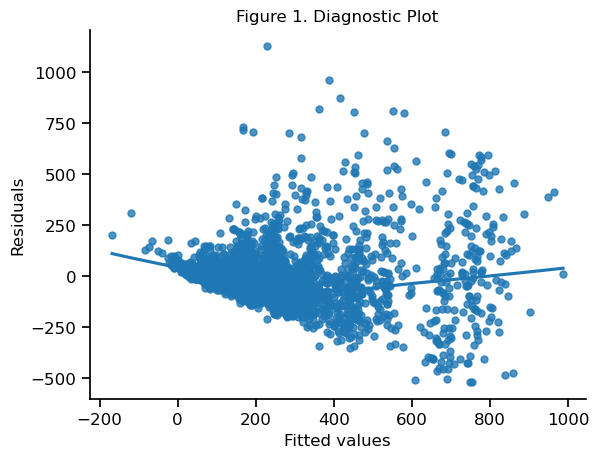

In [145]:
#the residuals of our model are random
fig, ax = plt.subplots()

sns.regplot(x=ols.fittedvalues, y=ols.resid, scatter_kws={'s' : 25}, lowess=True, ax=ax) 
ax.set_ylabel('Residuals')
ax.set_xlabel('Fitted values')
ax.set_title('Figure 1. Diagnostic Plot')
sns.despine()
plt.show()

The diagnostic plot (Figure 5) reveals a:
1. Nonlinear pattern in the residuals
2. Heteroskedasticity - a changing variance
This means suggests that the classical assumptions are not satisfied, and so the p-value and confidence intervals may not be valid. 

To improve our model, we can consider log transformations to the y-variable. Log transformations help reduce:
- Right skewness of the data
- Heteroskedasticity

### 4.1.2 Interaction Model

In [146]:
formula = 'y_train ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month + accommodates:cheap_properties_amenities'
ols = smf.ols(formula=formula, data=x_train_ols).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                y_train   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.590
Method:                 Least Squares   F-statistic:                     168.6
Date:                Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                        21:28:37   Log-Likelihood:                -17978.
No. Observations:                2800   AIC:                         3.601e+04
Df Residuals:                    2775   BIC:                         3.615e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Intercept                                 157.7671     20.346      7.754      0.000     117.873     197.661
a_few_days_or_more                        -87.0259     46.225     -1.883      0.060    -177.665       3.614
within_a_day                               10.3083     19.012      0.542      0.588     -26.972      47.588
within_a_few_hours                         11.3891     17.395      0.655      0.513     -22.719      45.497
within_an_hour                             17.9379     16.794      1.068      0.286     -14.993      50.868
expensive_neighbourhood_tokens            285.9489    169.814      1.684      0.092     -47.026     618.924
expensive_property_type                    55.4559      9.152      6.059      0.000      37.510      73.402
cheap_property_type                       -91.3681      8.869    -10.302      0.000    -108.758     -73.978
bedroom1                                    9.4841     11.753      0.807      0.420     -13.561      32.529
bedroom2                                   67.0803     13.586      4.937      0.000      40.440      93.721
bedroom3                                  191.0925     18.332     10.424      0.000     155.148     227.037
bedroom4                                  394.3375     24.434     16.139      0.000     346.426     442.249
bedroom5                                  420.2980     33.444     12.567      0.000     354.720     485.876
bedroom6                                  549.7430     58.659      9.372      0.000     434.724     664.762
greater_or_equal_7_bedroom                 97.4102    155.021      0.628      0.530    -206.557     401.378
expensive_properties_amenities             91.2899     28.176      3.240      0.001      36.043     146.537
cheap_properties_amenities                -30.2763     25.977     -1.166      0.244     -81.213      20.660
interaction_rating_neighborhood           -41.8264     34.652     -1.207      0.228    -109.772      26.119
host_response_rate                         -4.0952      7.674     -0.534      0.594     -19.143      10.952
host_acceptance_rate                      -12.7031      3.337     -3.807      0.000     -19.247      -6.159
accommodates                               22.4156      6.532      3.432      0.001       9.608      35.223
review_scores_rating                        5.3161      3.383      1.571      0.116      -1.317      11.949
review_scores_location                     16.1504      3.703      4.361      0.000       8.889      23.412
reviews_per_month                         -17.3432      3.059     -5.669      0.000     -23.342     -11.344
accommodates:cheap_properties_amenities    -8.8122     29.113     -0.303      0.762     -65.897      48.272
===========================================================

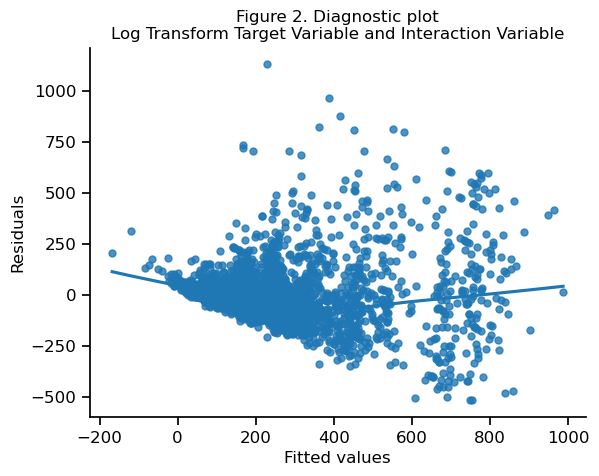

In [147]:
fig, ax = plt.subplots()
sns.regplot(x=ols.fittedvalues, y=ols.resid, scatter_kws={'s': 25}, lowess=True, ax=ax)
ax.set_ylabel('Residuals'); ax.set_xlabel('Fitted values')
ax.set_title("Figure 2. Diagnostic plot\nLog Transform Target Variable and Interaction Variable")
sns.despine()
plt.show()

### 4.1.3 Log transformation of the response variable

In [148]:
formula = 'np.log(y_train) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
ols = smf.ols(formula=formula, data=x_train_ols).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        np.log(y_train)   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     250.2
Date:                Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                        21:28:38   Log-Likelihood:                -1610.4
No. Observations:                2800   AIC:                             3269.
Df Residuals:                    2776   BIC:                             3411.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                           5.0534      0.059     85.890      0.000       4.938       5.169
a_few_days_or_more                 -0.3163      0.134     -2.366      0.018      -0.578      -0.054
within_a_day                       -0.0212      0.055     -0.386      0.700      -0.129       0.087
within_a_few_hours                  0.0132      0.050      0.262      0.794      -0.085       0.112
within_an_hour                      0.0528      0.049      1.086      0.278      -0.042       0.148
expensive_neighbourhood_tokens      1.0273      0.491      2.092      0.037       0.064       1.990
expensive_property_type             0.1528      0.026      5.779      0.000       0.101       0.205
cheap_property_type                -0.7533      0.026    -29.376      0.000      -0.804      -0.703
bedroom1                            0.0413      0.034      1.215      0.224      -0.025       0.108
bedroom2                            0.3089      0.039      7.864      0.000       0.232       0.386
bedroom3                            0.5546      0.053     10.471      0.000       0.451       0.659
bedroom4                            0.8563      0.071     12.144      0.000       0.718       0.995
bedroom5                            0.8348      0.096      8.655      0.000       0.646       1.024
bedroom6                            0.9633      0.169      5.688      0.000       0.631       1.295
greater_or_equal_7_bedroom          0.2417      0.448      0.539      0.590      -0.637       1.120
expensive_properties_amenities      0.1644      0.081      2.018      0.044       0.005       0.324
cheap_properties_amenities         -0.0578      0.075     -0.769      0.442      -0.205       0.090
interaction_rating_neighborhood    -0.1589      0.100     -1.586      0.113      -0.355       0.038
host_response_rate                 -0.0079      0.022     -0.358      0.721      -0.051       0.036
host_acceptance_rate               -0.0294      0.010     -3.047      0.002      -0.048      -0.010
accommodates                        0.1180      0.019      6.305      0.000       0.081       0.155
review_scores_rating                0.0066      0.010      0.679      0.497      -0.013       0.026
review_scores_location              0.0834      0.011      7.787      0.000       0.062       0.104
reviews_per_month                  -0.0427      0.009     -4.820      0.000      -0.060      -0.025
==============================================================================
Omnibus:                       54.578   Durbin-Watson:                   1.943
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              108.698
Skew:                           0.069   Prob(JB):                     2.49e-24
Kurtosis:                       3.955   Cond. No.                  

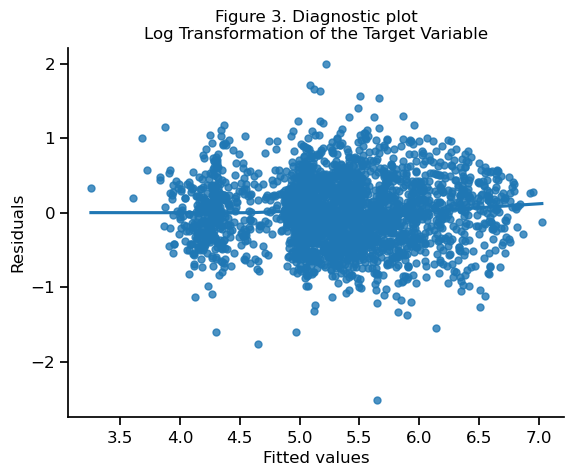

In [149]:
fig, ax = plt.subplots()
sns.regplot(x=ols.fittedvalues, y=ols.resid, scatter_kws={'s' : 25}, lowess=True, ax=ax) 
ax.set_ylabel('Residuals'); ax.set_xlabel('Fitted values')
ax.set_title("Figure 3. Diagnostic plot\nLog Transformation of the Target Variable")
sns.despine()
plt.show()

### 4.1.4 Log transformation of the response variable with an interaction term

In [150]:
formula = 'np.log(y_train) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month + accommodates:cheap_properties_amenities'
ols = smf.ols(formula=formula, data=x_train_ols).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        np.log(y_train)   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     239.8
Date:                Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                        21:28:38   Log-Likelihood:                -1610.2
No. Observations:                2800   AIC:                             3270.
Df Residuals:                    2775   BIC:                             3419.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Intercept                                   5.0540      0.059     85.882      0.000       4.939       5.169
a_few_days_or_more                         -0.3144      0.134     -2.352      0.019      -0.577      -0.052
within_a_day                               -0.0207      0.055     -0.377      0.706      -0.129       0.087
within_a_few_hours                          0.0130      0.050      0.259      0.796      -0.086       0.112
within_an_hour                              0.0530      0.049      1.091      0.275      -0.042       0.148
expensive_neighbourhood_tokens              1.0296      0.491      2.096      0.036       0.066       1.993
expensive_property_type                     0.1520      0.026      5.741      0.000       0.100       0.204
cheap_property_type                        -0.7530      0.026    -29.354      0.000      -0.803      -0.703
bedroom1                                    0.0414      0.034      1.217      0.224      -0.025       0.108
bedroom2                                    0.3081      0.039      7.839      0.000       0.231       0.385
bedroom3                                    0.5531      0.053     10.432      0.000       0.449       0.657
bedroom4                                    0.8532      0.071     12.073      0.000       0.715       0.992
bedroom5                                    0.8299      0.097      8.579      0.000       0.640       1.020
bedroom6                                    0.9567      0.170      5.639      0.000       0.624       1.289
greater_or_equal_7_bedroom                  0.2322      0.448      0.518      0.605      -0.647       1.111
expensive_properties_amenities              0.1645      0.081      2.019      0.044       0.005       0.324
cheap_properties_amenities                 -0.0577      0.075     -0.767      0.443      -0.205       0.090
interaction_rating_neighborhood            -0.1594      0.100     -1.590      0.112      -0.356       0.037
host_response_rate                         -0.0077      0.022     -0.346      0.729      -0.051       0.036
host_acceptance_rate                       -0.0293      0.010     -3.039      0.002      -0.048      -0.010
accommodates                                0.1197      0.019      6.337      0.000       0.083       0.157
review_scores_rating                        0.0065      0.010      0.665      0.506      -0.013       0.026
review_scores_location                      0.0836      0.011      7.801      0.000       0.063       0.105
reviews_per_month                          -0.0427      0.009     -4.823      0.000      -0.060      -0.025
accommodates:cheap_properties_amenities    -0.0563      0.084     -0.669      0.504      -0.221       0.109
===========================================================

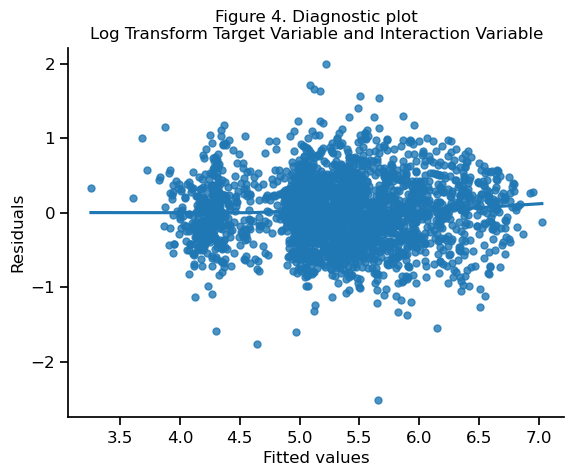

In [151]:
fig, ax = plt.subplots()
sns.regplot(x=ols.fittedvalues, y=ols.resid, scatter_kws={'s': 25}, lowess=True, ax=ax)
ax.set_ylabel('Residuals'); ax.set_xlabel('Fitted values')
ax.set_title("Figure 4. Diagnostic plot\nLog Transform Target Variable and Interaction Variable")
sns.despine()
plt.show()

### 4.1.5 Model evaluation

We now compare different specifications on the test data. Note that for the models with a log transformed response, we use an appropriate retransformation and an adjustment when computing the predictions for salary.

In [152]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
results = pd.DataFrame(columns=['RMSE', 'R2']) # Initialise a dataframe for our results

In [153]:
x_vali_ols = x_vali.copy()
x_vali_ols.rename({'Hotel room': 'Hotel_room', 'Private room': 'Private_room','Shared room': 'Shared_room',
                 "1 bedroom": 'bedroom1','2 bedroom': 'bedroom2','3 bedroom': 'bedroom3',
                 '4 bedroom': 'bedroom4','5 bedroom': 'bedroom5','6 bedroom': 'bedroom6',
                 'a few days or more': 'a_few_days_or_more', 
                  'within a day': 'within_a_day','within a few hours': 'within_a_few_hours', 
                  'within an hour': 'within_an_hour','greater or equal 7 bedroom': 'greater_or_equal_7_bedroom'}, axis=1, inplace=True)

In [154]:
y_vali

200       75
1078     189
610      175
2159     429
1169     135
        ... 
549      115
2651    1133
1535     744
218      300
2424     499
Name: price, Length: 1200, dtype: int64

### Model 1 - Base Model

In [155]:
formula = 'y_train ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
ols = smf.ols(formula=formula, data=x_train_ols).fit()

predictions = ols.predict(x_vali_ols)

rmse = mean_squared_error(y_vali, predictions, squared=False)
r2 = r2_score(y_vali, predictions)

results.loc["Base model"] = rmse, r2

### Model 2 - Interaction Model

In [156]:
formula = 'y_train ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month + accommodates:cheap_properties_amenities'
ols = smf.ols(formula=formula, data=x_train_ols).fit()

predictions = ols.predict(x_vali_ols)

rmse = mean_squared_error(y_vali, predictions, squared=False)
r2 = r2_score(y_vali, predictions)

results.loc["Interaction model"] = rmse, r2

### Model 3 - Log Transform

In [157]:
formula = 'np.log(y_train) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
ols = smf.ols(formula=formula, data=x_train_ols).fit()
predictions = np.exp(ols.predict(x_vali_ols))*np.mean(np.exp(ols.resid))

rmse = mean_squared_error(y_vali, predictions, squared=False)
r2 = r2_score(y_vali, predictions)

results.loc["Log transform"] = rmse, r2

### Model 4 - Log + Interaction

In [158]:
formula = 'np.log(y_train) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month + accommodates:cheap_properties_amenities'
ols = smf.ols(formula=formula, data=x_train_ols).fit()

predictions = np.exp(ols.predict(x_vali_ols))*np.mean(np.exp(ols.resid))

rmse = mean_squared_error(y_vali, predictions, squared=False)
r2 = r2_score(y_vali, predictions)

results.loc["Log + interaction"] = rmse, r2

In [159]:
results.round(3)

,RMSE,R2
Base model,154.874,0.598
Interaction model,154.893,0.598
Log transform,150.474,0.620
Log + interaction,150.525,0.620


### 4.1.6 Forward selection

In [160]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

In [161]:
y_vali

200       75
1078     189
610      175
2159     429
1169     135
        ... 
549      115
2651    1133
1535     744
218      300
2424     499
Name: price, Length: 1200, dtype: int64

In [162]:
#??
df = train_m
Y = df['price']


features = set(df.columns) - {'price'}

s = StandardScaler()
best_features = []

for k in range(len(features)):
    best_rss = None
    for f in features:
        X =df[best_features+[f]] 
        X = s.fit_transform(X)
        model = LinearRegression()
        model.fit(X,Y)
        pred = model.predict(X)
        rss = ((Y - pred)**2).sum()
        if (best_rss is None) or (rss < best_rss):
            best_rss = rss
            best_feature = f

    best_features.append(best_feature)
    features -= {best_feature}

print(best_features)

['accommodates', 'interaction_rating_neighborhood', 'expensive_property_type', '4 bedroom', 'cheap_property_type', 'reviews_per_month', '5 bedroom', '3 bedroom', '6 bedroom', '2 bedroom', 'review_scores_location', 'a few days or more', 'host_acceptance_rate', 'expensive_properties_amenities', 'expensive_neighbourhood_tokens', 'review_scores_rating', 'cheap_properties_amenities', 'within an hour', '1 bedroom', 'greater or equal 7 bedroom', 'host_response_rate', 'within a few hours', 'within a day']


In [163]:
print('Number of predictor in Forward Selection: {}'.format(len(best_features)))
print('Number of predictor in Base OLS Model: {}'.format(len(x_train_ols.columns)))

Number of predictor in Forward Selection: 23
Number of predictor in Base OLS Model: 23


Our data set is not large so we should be careful stating our conclusions. Nonetheless our modelling indicates:

* There is a significant difference in pay which can be explained by gender
* This difference in pay (men being paid more than women) scales with experience, which might indicate that women's experience is less recognised (and hence compensated) in the workforce

To directly answer the question, men and women with the same level of experience are ***not*** paid the same on average. Women appear to be significantly more likely to be paid less. Our modelling indicates that a man with 10 years of experience (the median level of experience) is likely to earn $10,000 more than a woman with 10 years of experience.

### <font color = '#e64626'><a id='model_3'>4.2. Model 2: *Ridge/Lasso Regression*</a></font>

In [164]:
y_train= np.log(y_train)
y_vali = np.log(y_vali)

### Ridge Regression Model

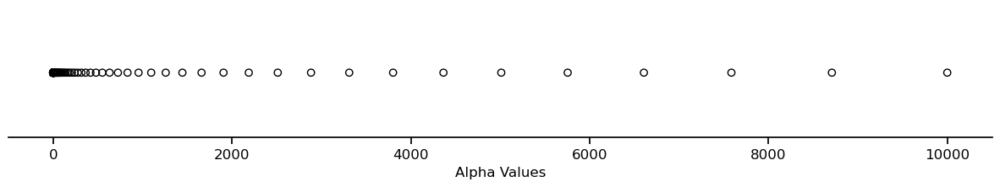

In [165]:
alphas = np.logspace(-5, 4, 151)

plt.figure(figsize=(15, 2))
plt.scatter(alphas, np.zeros(alphas.shape), facecolor='None', edgecolor='black')
sns.despine()
plt.yticks([])
plt.gca().spines['left'].set_visible(False)
plt.xlabel('Alpha Values');

In [166]:
from sklearn.linear_model import RidgeCV, Ridge

ridge = RidgeCV(alphas=alphas, cv=5)
ridge.fit(x_train, y_train)
best_ridge = Ridge(alpha=ridge.alpha_);

### Lasso Regression Model

In [167]:
from sklearn.linear_model import LassoCV, Lasso

lasso = LassoCV(cv=5)
lasso.fit(x_train, y_train)
best_lasso = Lasso(alpha=lasso.alpha_);

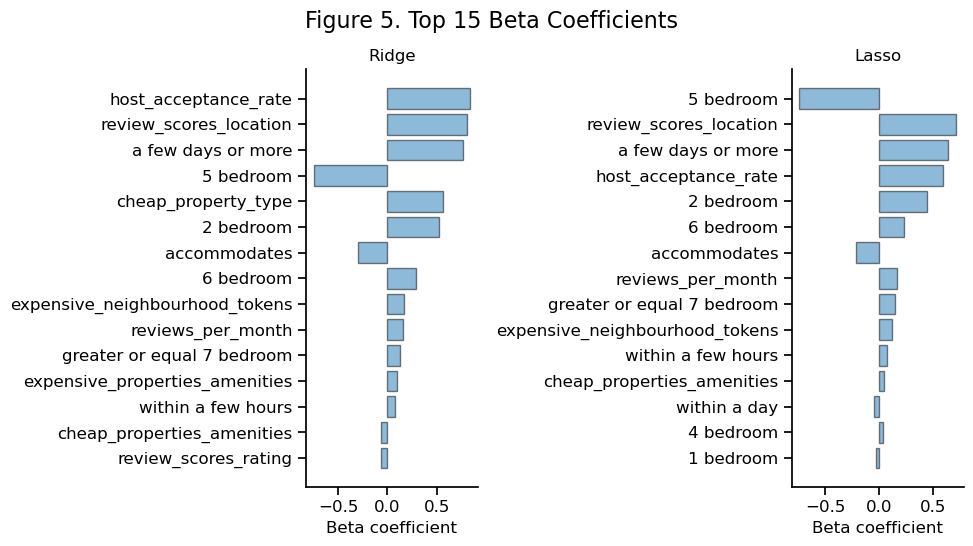

In [168]:
predictors = best_features

n_coefs = 15
model = [ridge, lasso]
model_name = ['Ridge', 'Lasso']
plt.figure(figsize = (10, 10))

for i in range(len(model)):
    betas = model[i].coef_

    indicies = np.argsort(np.abs(betas))[-n_coefs:]
    top_predictors = np.array(predictors)[indicies]
    top_betas = betas[indicies]

    plt.subplot(2, 2, i+1)
    plt.barh(top_predictors, top_betas, alpha=0.5, edgecolor='black')
    sns.despine()
    plt.xlabel('Beta coefficient')
    plt.title(model_name[i]);
plt.suptitle('Figure 5. Top {} Beta Coefficients'.format(n_coefs), fontsize = 16)
plt.tight_layout()

To guage how our regularisation methods affect our $\beta$ coefficients, we plot our $\beta$ coefficients for *all* 195 of our predictors for each model.

### Model Selection and Evaluation

In [169]:
from sklearn.model_selection import cross_val_predict
results = pd.DataFrame(columns=['RMSE', 'R2'])

In [170]:
# Ridge
y_pred = cross_val_predict(best_ridge, x_train, y_train, cv=5)

rmse = mean_squared_error(np.exp(y_train), np.exp(y_pred), squared=False)
r2 = r2_score(np.exp(y_train), np.exp(y_pred))


results.loc['Ridge'] = rmse, r2

In [171]:
#Lasso
y_pred = cross_val_predict(best_lasso, x_train, y_train, cv=5)

rmse = mean_squared_error(np.exp(y_train), np.exp(y_pred), squared=False)
r2 = r2_score(np.exp(y_train), np.exp(y_pred))

results.loc['Lasso'] = rmse, r2

In [172]:
# results.round(3)

We find that #Ridge net have the lowest estimated cross-validation error. Since both methods perfomed variable selection (see above), the results suggest that variable selection is a critical feature for improving predictive performance in this problem.

In [173]:
#result

In [174]:
y_pred = ridge.predict(x_vali)

rmse = mean_squared_error(np.exp(y_vali), np.exp(y_pred), squared=False)
r2 = r2_score(np.exp(y_vali), np.exp(y_pred))

print('Our Ridge model has a test RMSE of {:.3f} and a test r-squared coefficient of {:.2f}'.format(rmse, r2))

Our Ridge model has a test RMSE of 155.771 and a test r-squared coefficient of 0.59


In [175]:
y_pred = lasso.predict(x_vali)

rmse = mean_squared_error(np.exp(y_vali), np.exp(y_pred), squared=False)
r2 = r2_score(np.exp(y_vali), np.exp(y_pred))


print('Our lasso model has a test RMSE of {:.3f} and a test r-squared coefficient of {:.2f}'.format(rmse, r2))

Our lasso model has a test RMSE of 156.948 and a test r-squared coefficient of 0.59


### submission file

In [176]:
#whole dataset

train_sub_x = train_new.drop(['price'],axis = 1)

train_sub_x.rename({'Hotel room': 'Hotel_room', 'Private room': 'Private_room','Shared room': 'Shared_room',
                 "1 bedroom": 'bedroom1','2 bedroom': 'bedroom2','3 bedroom': 'bedroom3',
                 '4 bedroom': 'bedroom4','5 bedroom': 'bedroom5','6 bedroom': 'bedroom6',
                 'a few days or more': 'a_few_days_or_more', 
                  'within a day': 'within_a_day','within a few hours': 'within_a_few_hours', 
                  'within an hour': 'within_an_hour','greater or equal 7 bedroom': 'greater_or_equal_7_bedroom'}, axis=1, inplace=True)

test_new.rename({'Hotel room': 'Hotel_room', 'Private room': 'Private_room','Shared room': 'Shared_room',
                 "1 bedroom": 'bedroom1','2 bedroom': 'bedroom2','3 bedroom': 'bedroom3',
                 '4 bedroom': 'bedroom4','5 bedroom': 'bedroom5','6 bedroom': 'bedroom6',
                 'a few days or more': 'a_few_days_or_more', 
                  'within a day': 'within_a_day','within a few hours': 'within_a_few_hours', 
                  'within an hour': 'within_an_hour','greater or equal 7 bedroom': 'greater_or_equal_7_bedroom'}, axis=1, inplace=True)


train_sub_y = train_new['price']

In [177]:
# formula = 'np.log(train_new['price']) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
# ols = smf.ols(formula=formula, data=train_sub).fit()


formula = 'np.log(train_sub_y) ~ a_few_days_or_more + within_a_day + within_a_few_hours + within_an_hour + expensive_neighbourhood_tokens + expensive_property_type + cheap_property_type + bedroom1 + bedroom2 + bedroom3 + bedroom4 + bedroom5 + bedroom6 + greater_or_equal_7_bedroom + expensive_properties_amenities + cheap_properties_amenities + interaction_rating_neighborhood + host_response_rate + host_acceptance_rate + accommodates + review_scores_rating + review_scores_location + reviews_per_month'
ols = smf.ols(formula=formula, data=train_sub_x).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     np.log(train_sub_y)   R-squared:                       0.675
Model:                             OLS   Adj. R-squared:                  0.674
Method:                  Least Squares   F-statistic:                     359.7
Date:                 Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                         21:28:45   Log-Likelihood:                -2287.5
No. Observations:                 4000   AIC:                             4623.
Df Residuals:                     3976   BIC:                             4774.
Df Model:                           23                                         
Covariance Type:             nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                           4.9990      0.049    101.969      0.000       4.903       5.095
a_few_days_or_more                 -0.2279      0.108     -2.112      0.035      -0.439      -0.016
within_a_day                        0.0327      0.045      0.721      0.471      -0.056       0.122
within_a_few_hours                  0.0835      0.042      1.996      0.046       0.001       0.165
within_an_hour                      0.0927      0.040      2.302      0.021       0.014       0.172
expensive_neighbourhood_tokens      0.6570      0.422      1.557      0.119      -0.170       1.484
expensive_property_type             0.1425      0.022      6.468      0.000       0.099       0.186
cheap_property_type                -0.7514      0.022    -34.911      0.000      -0.794      -0.709
bedroom1                            0.0584      0.029      2.027      0.043       0.002       0.115
bedroom2                            0.3227      0.033      9.841      0.000       0.258       0.387
bedroom3                            0.5828      0.044     13.290      0.000       0.497       0.669
bedroom4                            0.8640      0.058     14.769      0.000       0.749       0.979
bedroom5                            0.8612      0.079     10.871      0.000       0.706       1.017
bedroom6                            0.8877      0.130      6.816      0.000       0.632       1.143
greater_or_equal_7_bedroom          0.2154      0.441      0.488      0.625      -0.649       1.080
expensive_properties_amenities      0.1921      0.063      3.039      0.002       0.068       0.316
cheap_properties_amenities         -0.0349      0.064     -0.543      0.587      -0.161       0.091
interaction_rating_neighborhood    -0.0836      0.086     -0.972      0.331      -0.252       0.085
host_response_rate                 -0.0134      0.018     -0.748      0.454      -0.049       0.022
host_acceptance_rate               -0.0161      0.008     -2.000      0.046      -0.032      -0.000
accommodates                        0.1267      0.015      8.219      0.000       0.096       0.157
review_scores_rating                0.0104      0.008      1.266      0.206      -0.006       0.026
review_scores_location              0.0722      0.009      8.216      0.000       0.055       0.089
reviews_per_month                  -0.0443      0.007     -5.981      0.000      -0.059      -0.030
==============================================================================
Omnibus:                      100.254   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              212.565
Skew:                           0.123   Prob(JB):                     6.95e-47
Kurtosis:                       4.102   Cond. No.       

In [178]:
predictions = np.exp(ols.predict(test_new))*np.mean(np.exp(ols.resid))
predictions

0       346.034065
1       173.635338
2       416.248735
3       241.397131
4       476.534574
           ...    
1995    178.903464
1996    145.266441
1997    230.906670
1998    582.812002
1999    221.268525
Length: 2000, dtype: float64

In [179]:
predictions = predictions.to_numpy()

In [180]:
predictions = predictions.reshape(-1,1)

In [181]:
id_col = np.arange(2000).reshape(-1, 1)
# y_pred = predictions*np.ones(2000).reshape(-1, 1)

data = np.hstack((id_col, predictions))

m1_submission = pd.DataFrame(data, columns=['id', 'price'])
m1_submission['id'] = m1_submission['id'].astype('int')

#m1_submission.to_csv('model1_submission.csv', index=False)

In [182]:
# ridge kaggle
ridge = RidgeCV(alphas=alphas, cv=5)
ridge.fit(train_sub_x, train_sub_y)
best_ridge = Ridge(alpha=ridge.alpha_)

best_ridge 


Ridge(alpha=0.47863009232263803)

In [183]:
predictions = ridge.predict(test_new)

In [184]:
predictions 

array([347.02928157, 154.26728311, 439.35692548, ..., 256.8960902 ,
       647.42971647, 206.95941994])

In [185]:
predictions = predictions.reshape(-1,1)

In [186]:
id_col = np.arange(2000).reshape(-1, 1)
# y_pred = predictions*np.ones(2000).reshape(-1, 1)

data = np.hstack((id_col, predictions))

m1_submission = pd.DataFrame(data, columns=['id', 'price'])
m1_submission['id'] = m1_submission['id'].astype('int')

#m1_submission.to_csv('model_ridge_submission.csv', index=False)

### <font color = '#e64626'><a id='model_4'>4.3. Model 3: *Single Regression Tree*</a></font>

In [187]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV


In [188]:
train0 = pd.read_csv('train.csv')
test0 = pd.read_csv('test.csv')

In [189]:
train_cate.columns

Index(['a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens',
       'expensive_property_type', 'cheap_property_type', '1 bedroom',
       '2 bedroom', '3 bedroom', '4 bedroom', '5 bedroom', '6 bedroom',
       'greater or equal 7 bedroom', 'expensive_properties_amenities',
       'cheap_properties_amenities', 'interaction_rating_neighborhood'],
      dtype='object')

In [190]:
train0["bedrooms"] = train0["bedrooms"].fillna(0)
test0["bedrooms"] = test0["bedrooms"].fillna(0)

In [191]:
df_tree_new= pd.concat([train0[['bedrooms','price']], train_cate[['a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens',
       'expensive_property_type', 'cheap_property_type','expensive_properties_amenities',
       'cheap_properties_amenities', 'interaction_rating_neighborhood']]],
                      axis=1)

In [192]:
df_tree_new1 = pd.concat([df_tree_new,train_new[['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month']]],
                        axis=1)

In [193]:
train_tree, validation_tree = train_test_split(df_tree_new1, train_size=0.7, random_state=1)

In [194]:
# x train
x_train = train_tree.drop(['price'],axis = 1)

# y train
y_train  = train_tree['price']

# x validation
x_vali = validation_tree.drop(['price'],axis = 1)
# y validation
y_vali  = validation_tree['price']

In [195]:
parameters = {'max_depth':np.arange(1,30,1), 'min_samples_leaf':np.arange(1,20,1)}
dtmodel3 = DecisionTreeRegressor(random_state = 1)
dt3 = GridSearchCV(dtmodel3, parameters)
dt3 = dt3.fit(x_train, y_train)

In [196]:
print(dt3.best_params_)

{'max_depth': 5, 'min_samples_leaf': 15}


In [197]:
tree = DecisionTreeRegressor(max_depth= 5,min_samples_leaf=15, random_state=1)
path = tree.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas = path.ccp_alphas

model3 = DecisionTreeRegressor(max_depth= 5,min_samples_leaf=15, random_state=1)

tuning_parameters = {'ccp_alpha': path.ccp_alphas,}

tree_cv3 = GridSearchCV(model3, tuning_parameters, cv=5, return_train_score=False)
tree_cv3.fit(x_train, y_train)

tree4 = tree_cv3.best_estimator_
tree_cv3.best_params_

{'ccp_alpha': 2.2574957151935706}

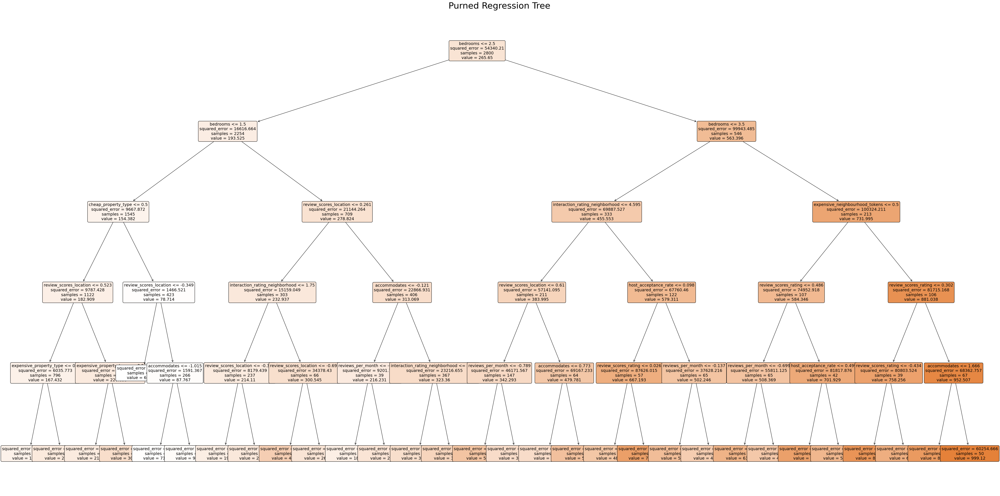

In [198]:
from sklearn.tree import plot_tree

plt.figure(figsize=(60,30))
plot_tree(tree4, filled=True, rounded=True, feature_names = x_train.columns, fontsize=14)
plt.title('Purned Regression Tree', fontsize=30);
plt.show()

In [199]:
from sklearn.metrics import mean_squared_error, r2_score
y_vali_pred3 = tree4.predict(x_vali)
rmse3 = mean_squared_error(y_vali, y_vali_pred3, squared=False)
print('RMSE:{:.3f}'.format(rmse3))

RMSE:152.871


### Submission for Tree

In [200]:
test_tree = pd.concat([test_cate,test[['host_response_rate','host_acceptance_rate','accommodates','beds',
                        'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value','reviews_per_month']]],axis=1)

In [201]:
id_col = np.arange(2000).reshape(-1, 1)
# y_pred = predictions*np.ones(2000).reshape(-1, 1)

data = np.hstack((id_col, predictions))

m1_submission = pd.DataFrame(data, columns=['id', 'price'])
m1_submission['id'] = m1_submission['id'].astype('int')

#m1_submission.to_csv('model_tree2_submission.csv', index=False)

### <font color = '#e64626'><a id='mode_5'>4.4. Model 4: *Gradient Boosting*</a></font>

In [202]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [203]:
train0 = pd.read_csv('train.csv')
test0 = pd.read_csv('test.csv')

In [204]:
train_cate.columns

Index(['a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens',
       'expensive_property_type', 'cheap_property_type', '1 bedroom',
       '2 bedroom', '3 bedroom', '4 bedroom', '5 bedroom', '6 bedroom',
       'greater or equal 7 bedroom', 'expensive_properties_amenities',
       'cheap_properties_amenities', 'interaction_rating_neighborhood'],
      dtype='object')

In [205]:
train0["bedrooms"] = train0["bedrooms"].fillna(0)
test0["bedrooms"] = test0["bedrooms"].fillna(0)

In [206]:
df_gb_new= pd.concat([train0[['bedrooms','price']], train_cate[['a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens',
       'expensive_property_type', 'cheap_property_type','expensive_properties_amenities',
       'cheap_properties_amenities', 'interaction_rating_neighborhood']]],
                      axis=1)

In [207]:
df_gb_new1 = pd.concat([df_gb_new,train_new[['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month']]],
                        axis=1)

In [208]:
train_xg, validation_xg = train_test_split(df_gb_new1, train_size=0.7, random_state=1)

In [209]:
# x train
x_train = train_xg.drop(['price'],axis = 1)

# y train
y_train  = train_xg['price']

# x validation
x_vali = validation_xg.drop(['price'],axis = 1)
# y validation
y_vali  = validation_xg['price']

In [210]:
model_new = GradientBoostingRegressor()

tuning_parameters = {
    'learning_rate': [0.01,0.05, 0.1],
    'n_estimators': [200,500,1000,1500],
    'max_depth': [2, 3, 4],
    'subsample': [0.2, 0.5,0.7]}

gb_cv = GridSearchCV(model_new, tuning_parameters, cv=5, return_train_score=False, n_jobs=4)
gb_cv.fit(x_train, y_train);
gb = gb_cv.best_estimator_

gb_cv.best_params_

{'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 1500, 'subsample': 0.7}

In [211]:
gb_new = GradientBoostingRegressor(learning_rate=0.01, max_depth=3, n_estimators=1500, subsample=0.7,random_state = 1)
gb_new.fit(x_train, y_train)

GradientBoostingRegressor(learning_rate=0.01, n_estimators=1500, random_state=1,
                          subsample=0.7)

In [212]:
y_vali_prednew = gb_new.predict(x_vali)

In [213]:
from sklearn.metrics import mean_squared_error, r2_score

In [214]:
rmse4 = mean_squared_error(y_vali, y_vali_prednew, squared=False)
print('RMSE:{:.3f}'.format(rmse4))

RMSE:144.383


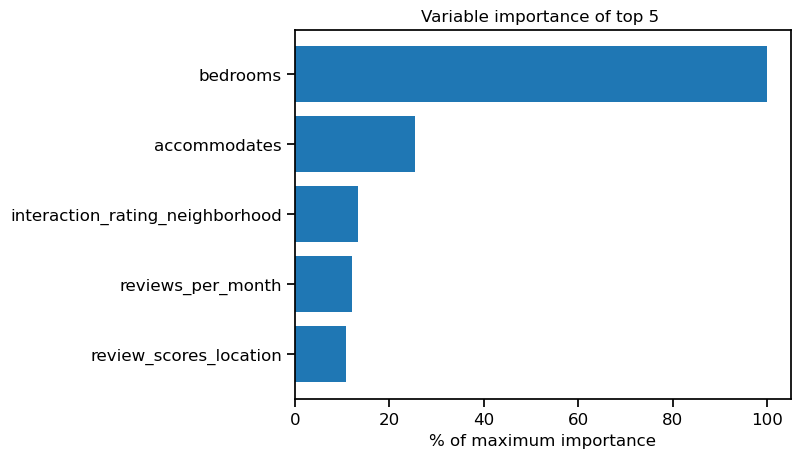

In [215]:
p = 5

importance = 100*(gb_new.feature_importances_/np.max(gb_new.feature_importances_))
feature_importance = pd.Series(importance, index= x_train.columns ).sort_values(ascending=True)

plt.barh(np.arange(p), feature_importance[-p:])
plt.yticks(np.arange(p), feature_importance[-p:].index)
plt.xlabel('% of maximum importance')
plt.title('Variable importance of top {} '.format(p));
plt.show()


### Submission for Boosting

In [216]:
test_gb_new= pd.concat([test0[['bedrooms']], test_cate[['a few days or more', 'within a day', 'within a few hours',
       'within an hour', 'expensive_neighbourhood_tokens',
       'expensive_property_type', 'cheap_property_type','expensive_properties_amenities',
       'cheap_properties_amenities', 'interaction_rating_neighborhood']]],
                      axis=1)

test_gb_new1 = pd.concat([test_gb_new,test_new[['host_response_rate','host_acceptance_rate','accommodates','review_scores_rating','review_scores_location','reviews_per_month']]],
                        axis=1)

In [217]:
predictions = gb_new.predict(test_gb_new1)

In [218]:
predictions = predictions.reshape(-1,1)

In [219]:
id_col = np.arange(2000).reshape(-1, 1)
# y_pred = predictions*np.ones(2000).reshape(-1, 1)

data = np.hstack((id_col, predictions))

m1_submission = pd.DataFrame(data, columns=['id', 'price'])
m1_submission['id'] = m1_submission['id'].astype('int')

#m1_submission.to_csv('model_xg_new1_submission.csv', index=False)

### Copy OLS

In [220]:
copy_log_ols=LinearRegression()
copy_log_ols.fit(x_train,y_train)

LinearRegression()

In [221]:
copy_log_ols.coef_

array([ 76.56652376, -98.27014098,   4.80809775,   4.99598297,
         8.78793405, 258.22841045,  82.07989904, -84.13843537,
       104.64129599, -22.86073926, -35.44684078,  -4.09672198,
       -12.89347939,  37.91203902,   6.12129886,  16.4425585 ,
       -17.52724451])

In [222]:
copy_log_ols.intercept_

104.50355834725983

### Random Forest

In [223]:
train_tree2 = pd.concat([train_cate,train[['host_response_rate','host_acceptance_rate','accommodates','beds',
                        'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value','reviews_per_month','price']]],axis=1) 

In [224]:
train_tr2, validation_tr2 = train_test_split(train_tree2, train_size=0.7, random_state=1)

In [225]:
# x train
x_train_tr2 = train_tr2.drop(['price'],axis = 1)

# y train
y_train_tr2  = train_tr2['price']

# x validation
x_vali_tr2 = validation_tr2.drop(['price'],axis = 1)
# y validation
y_vali_tr2  = validation_tr2['price']

In [226]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators= 300,n_jobs=-1)
tuning_parameters = {'min_samples_leaf':[1,3,5],'max_features':[1,2,3,4,5,6],'max_depth':[5,10]}

rf_cv = GridSearchCV(rf_model,tuning_parameters,cv=5,return_train_score=False)
rf_cv.fit(x_train_tr2,y_train_tr2)

rf = rf_cv.best_estimator_
rf_cv.best_params_


{'max_depth': 10, 'max_features': 6, 'min_samples_leaf': 3}

Text(0.5, 1.0, 'Feature Importance of Random Forest Model')

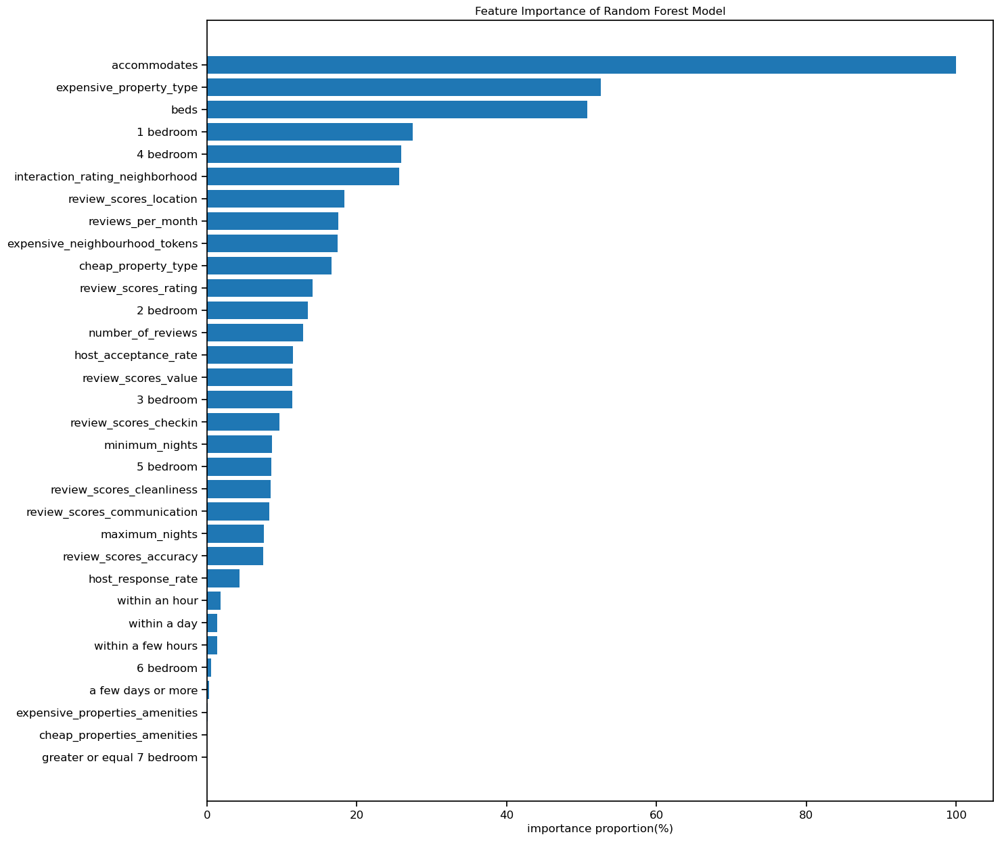

In [227]:
rf_col=x_train_tr2.columns
rf_para= len(rf_col)

plt.figure(figsize=(15,15))
rf_import = 100*(rf.feature_importances_/np.max(rf.feature_importances_))
feature_importance = pd.Series(rf_import, index=rf_col).sort_values(ascending=True)

plt.barh(np.arange(rf_para),feature_importance)
plt.yticks(np.arange(rf_para),feature_importance.index)

plt.xlabel('importance proportion(%)')
plt.title('Feature Importance of Random Forest Model')

In [228]:
y_vali_rf = rf.predict(x_vali_tr2)
rmse_rf = mean_squared_error(y_vali_tr2, y_vali_rf, squared=False)
print('RMSE:{:.3f}'.format(rmse_rf))

RMSE:147.458


### <font color = '#e64626'><a id='mode_5'>4.2. Model 5: *Model Stack*</a></font>

In [229]:
from sklearn.ensemble import StackingRegressor

In [230]:
models = [('Linear Regression',copy_log_ols),('Random Forest',rf), ('Gradient Boost', gb_new)]

stack = StackingRegressor(models, final_estimator=LinearRegression(positive=True), cv=5, n_jobs=-1)
stack.fit(x_train_tr2, y_train_tr2);

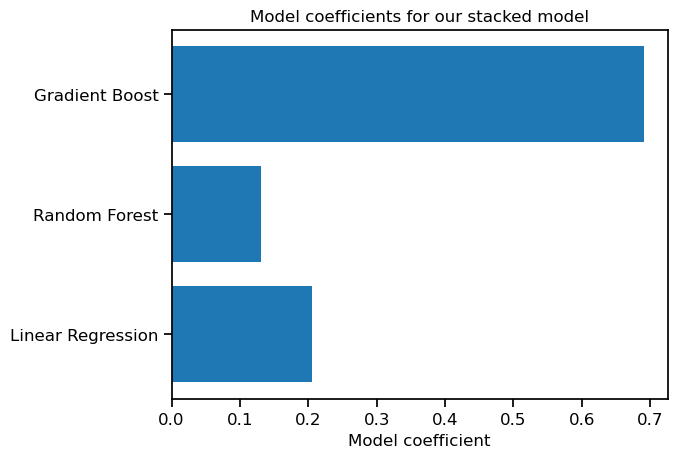

In [231]:
plt.barh(np.arange(len(models)), stack.final_estimator_.coef_)
plt.yticks(np.arange(len(models)), ['Linear Regression','Random Forest', 'Gradient Boost']);
plt.xlabel('Model coefficient')
plt.title('Model coefficients for our stacked model');


In [232]:
stack.final_estimator_.coef_

array([0.20568168, 0.13006749, 0.69084435])

In [233]:
y_vali_stack = stack.predict(x_vali_tr2)
rmse_stack = mean_squared_error(y_vali_tr2, y_vali_stack, squared=False)
print('RMSE:{:.3f}'.format(rmse_stack))

RMSE:142.676


In [234]:
test_tree = pd.concat([test_cate,test[['host_response_rate','host_acceptance_rate','accommodates','beds',
                        'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value','reviews_per_month']]],axis=1)

In [235]:
y_pred_stack=stack.predict(test_tree.values)

y_pred_stack

/Users/pengyi/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

/Users/pengyi/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

/Users/pengyi/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names



array([266.13674449, 225.53266972, 402.86947159, ..., 183.75264825,
       427.50182043, 170.02699708])

### Submission file

In [236]:
stack_submit=pd.DataFrame(np.c_[test_tree.index,y_pred_stack],columns=['id','price'])
stack_submit['id']=stack_submit['id'].astype(int)
#stack_submit.to_csv('Model Stacking Submission.csv',index= False)